In [1]:
import os
from google.colab import drive
drive.mount('/content/drive/')
import os

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [15]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import ParameterGrid
import tqdm
import pickle

In [4]:
os.chdir('/content/drive/MyDrive/UW 5th datathon')

In [5]:
df = pd.read_csv('UrbanEdgeApparel.csv')
df = df.dropna(subset=['Order Month']).reset_index(drop = True)
df = df[['Order Status', 'Order Date', 'Company ID', 'Product ID', 'Product Quantity', 'Total Selling Price', 'Shipping Country']]

In [6]:
df = df[df['Order Status'] != 'Canceled']

In [7]:
df['date_formatted'] = pd.to_datetime(df['Order Date'])
df['year_month'] = df['date_formatted'].dt.to_period('M')
df

,Order Status,Order Date,Company ID,Product ID,Product Quantity,Total Selling Price,Shipping Country,date_formatted,year_month
0,Completed,6/6/2013,Company_87239,Prod_5030,50,215.00,United States,2013-06-06,2013-06
1,Completed,6/6/2013,Company_87239,Prod_70018,50,75.00,United States,2013-06-06,2013-06
2,Completed,6/6/2013,Company_83024,Prod_1000,1,3.95,United States,2013-06-06,2013-06
3,Completed,6/6/2013,Company_83024,Prod_1000,1,3.95,United States,2013-06-06,2013-06
4,Completed,6/6/2013,Company_83024,Prod_1000,2,7.90,United States,2013-06-06,2013-06
...,...,...,...,...,...,...,...,...,...
89488,Completed,12/31/2021,Company_42529,Prod_5100,15,45.00,United States,2021-12-31,2021-12
89489,Completed,12/31/2021,Company_42529,Prod_5060,4,34.00,United States,2021-12-31,2021-12
89490,Completed,12/31/2021,Company_42529,Prod_5060,2,17.00,United States,2021-12-31,2021-12
89491,Completed,12/31/2021,Company_42529,Prod_5060,6,66.00,United States,2021-12-31,2021-12


In [ ]:
df.value_counts('Order Status')

Order Status
Completed    87142
Process       1113
Name: count, dtype: int64

In [8]:
df['selling_price'] = df['Total Selling Price']/df['Product Quantity']

# Train For Company ID

##Filtering Data

In [135]:
column_name = 'Company ID'

In [136]:
unique_id = df[column_name].unique()
filtered_id = []
for id in unique_id:
  curr_df = df[df[column_name] == id]
  months_reported = curr_df['year_month'].unique()
  if len(months_reported) > 60:
    for i in months_reported:
      if pd.Period('2023-06') <= i <= pd.Period('2024-05'):
        filtered_id.append(id)
        break
len(filtered_id)

6

## Finetuing model

In [ ]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tqdm

In [ ]:
from sklearn.model_selection import ParameterGrid
param_grid = {'seasonality_mode': ["additive", 'multiplicative'],
              'seasonality_prior_scale': [1, 5, 10, 20],
              'holidays_prior_scale': [5, 10, 20, 25],
              'changepoint_prior_scale': [0.005, 0.01, 0.05, 0.1]}
grid = ParameterGrid(param_grid)
len(list(grid))

128

In [ ]:
import logging

logging.getLogger("prophet").setLevel(logging.WARNING)
logging.getLogger("cmdstanpy").disabled=True

In [137]:
#Store the results
mape = {}
for id in filtered_id:

  mape[id] = []
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  #Loop
  for params in tqdm.tqdm(grid):
    #model
    model = Prophet(seasonality_mode = params['seasonality_mode'],
                seasonality_prior_scale = params['seasonality_prior_scale'],
                holidays_prior_scale = params['holidays_prior_scale'],
                changepoint_prior_scale = params['changepoint_prior_scale'])
    model.fit(curr_df)

    #CV
    df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')

    #Measure the error and store the result
    error = performance_metrics(df_cv)["mape"].mean()
    mape[id].append(error)
    print(error)

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  1%|          | 1/128 [00:02<05:15,  2.48s/it]

3.0164575331915557


  0%|          | 0/15 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:04<04:49,  2.30s/it]

3.0733565801361573


  0%|          | 0/15 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:06<04:44,  2.27s/it]

3.0740699620753125


  0%|          | 0/15 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:09<04:51,  2.35s/it]

3.136789629867648


  0%|          | 0/15 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:11<04:52,  2.38s/it]

3.0359644872713374


  0%|          | 0/15 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:13<04:42,  2.32s/it]

3.168753154585129


  0%|          | 0/15 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:16<04:37,  2.30s/it]

3.225163647377041


  0%|          | 0/15 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:18<04:35,  2.30s/it]

3.2524032162582186


  0%|          | 0/15 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:21<04:42,  2.37s/it]

3.0164575331915557


  0%|          | 0/15 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:23<04:34,  2.32s/it]

3.0733565801361573


  0%|          | 0/15 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:25<04:32,  2.33s/it]

3.0740699620753125


  0%|          | 0/15 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:27<04:28,  2.31s/it]

3.136789629867648


  0%|          | 0/15 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:30<04:31,  2.36s/it]

3.0359644872713374


  0%|          | 0/15 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:32<04:25,  2.33s/it]

3.168753154585129


  0%|          | 0/15 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:34<04:20,  2.31s/it]

3.225163647377041


  0%|          | 0/15 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:37<04:18,  2.31s/it]

3.2524032162582186


  0%|          | 0/15 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:39<04:23,  2.37s/it]

3.0164575331915557


  0%|          | 0/15 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:41<04:14,  2.32s/it]

3.0733565801361573


  0%|          | 0/15 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:44<04:09,  2.29s/it]

3.0740699620753125


  0%|          | 0/15 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:46<04:02,  2.25s/it]

3.136789629867648


  0%|          | 0/15 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [00:48<04:06,  2.30s/it]

3.0359644872713374


  0%|          | 0/15 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [00:50<04:00,  2.27s/it]

3.168753154585129


  0%|          | 0/15 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [00:53<03:58,  2.27s/it]

3.225163647377041


  0%|          | 0/15 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [00:55<03:57,  2.28s/it]

3.2524032162582186


  0%|          | 0/15 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [00:58<04:02,  2.35s/it]

3.0164575331915557


  0%|          | 0/15 [00:00<?, ?it/s]

 20%|██        | 26/128 [01:00<03:56,  2.32s/it]

3.0733565801361573


  0%|          | 0/15 [00:00<?, ?it/s]

 21%|██        | 27/128 [01:02<03:51,  2.29s/it]

3.0740699620753125


  0%|          | 0/15 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [01:04<03:45,  2.25s/it]

3.136789629867648


  0%|          | 0/15 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [01:07<03:48,  2.31s/it]

3.0359644872713374


  0%|          | 0/15 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [01:09<03:42,  2.27s/it]

3.168753154585129


  0%|          | 0/15 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [01:11<03:39,  2.26s/it]

3.225163647377041


  0%|          | 0/15 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [01:13<03:38,  2.27s/it]

3.2524032162582186


  0%|          | 0/15 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [01:16<03:33,  2.25s/it]

2.9997569504236465


  0%|          | 0/15 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [01:18<03:46,  2.40s/it]

3.054087261732147


  0%|          | 0/15 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [01:21<03:39,  2.36s/it]

3.0206383785898847


  0%|          | 0/15 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [01:23<03:32,  2.31s/it]

3.051509386347353


  0%|          | 0/15 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [01:25<03:30,  2.32s/it]

2.8334564494679504


  0%|          | 0/15 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [01:28<03:32,  2.36s/it]

2.9559387094713645


  0%|          | 0/15 [00:00<?, ?it/s]

 30%|███       | 39/128 [01:30<03:29,  2.35s/it]

3.001554252553471


  0%|          | 0/15 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [01:32<03:27,  2.36s/it]

3.052420580561182


  0%|          | 0/15 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [01:34<03:21,  2.32s/it]

2.9997569504236465


  0%|          | 0/15 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [01:37<03:31,  2.45s/it]

3.054087261732147


  0%|          | 0/15 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [01:40<03:24,  2.41s/it]

3.0206383785898847


  0%|          | 0/15 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [01:42<03:17,  2.35s/it]

3.051509386347353


  0%|          | 0/15 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [01:44<03:13,  2.33s/it]

2.8334564494679504


  0%|          | 0/15 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [01:46<03:13,  2.36s/it]

2.9559387094713645


  0%|          | 0/15 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [01:49<03:10,  2.35s/it]

3.001554252553471


  0%|          | 0/15 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [01:51<03:14,  2.43s/it]

3.052420580561182


  0%|          | 0/15 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [01:54<03:06,  2.36s/it]

2.9997569504236465


  0%|          | 0/15 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [01:56<03:15,  2.51s/it]

3.054087261732147


  0%|          | 0/15 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [01:59<03:07,  2.44s/it]

3.0206383785898847


  0%|          | 0/15 [00:00<?, ?it/s]

 41%|████      | 52/128 [02:01<03:00,  2.38s/it]

3.051509386347353


  0%|          | 0/15 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [02:03<02:57,  2.37s/it]

2.8334564494679504


  0%|          | 0/15 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [02:06<02:57,  2.40s/it]

2.9559387094713645


  0%|          | 0/15 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [02:08<02:53,  2.38s/it]

3.001554252553471


  0%|          | 0/15 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [02:10<02:51,  2.38s/it]

3.052420580561182


  0%|          | 0/15 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [02:13<02:45,  2.33s/it]

2.9997569504236465


  0%|          | 0/15 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [02:15<02:52,  2.46s/it]

3.054087261732147


  0%|          | 0/15 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [02:18<02:45,  2.40s/it]

3.0206383785898847


  0%|          | 0/15 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [02:20<02:39,  2.35s/it]

3.051509386347353


  0%|          | 0/15 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [02:22<02:37,  2.34s/it]

2.8334564494679504


  0%|          | 0/15 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [02:25<02:36,  2.38s/it]

2.9559387094713645


  0%|          | 0/15 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [02:27<02:33,  2.36s/it]

3.001554252553471


  0%|          | 0/15 [00:00<?, ?it/s]

 50%|█████     | 64/128 [02:29<02:31,  2.36s/it]

3.052420580561182


  0%|          | 0/15 [00:00<?, ?it/s]

 51%|█████     | 65/128 [02:32<02:38,  2.51s/it]

2.198647163804838


  0%|          | 0/15 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [02:35<02:41,  2.60s/it]

2.4102107873976277


  0%|          | 0/15 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [02:38<02:47,  2.74s/it]

2.405507559485517


  0%|          | 0/15 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [02:41<02:46,  2.78s/it]

2.2549265710466346


  0%|          | 0/15 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [02:44<02:48,  2.86s/it]

2.0176316782292765


  0%|          | 0/15 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [02:47<02:50,  2.94s/it]

1.8538070709306833


  0%|          | 0/15 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [02:51<02:56,  3.10s/it]

2.1423508829007334


  0%|          | 0/15 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [02:54<02:54,  3.11s/it]

2.135831545377622


  0%|          | 0/15 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [02:57<02:47,  3.05s/it]

2.198647163804838


  0%|          | 0/15 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [03:00<02:41,  2.99s/it]

2.4102107873976277


  0%|          | 0/15 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [03:03<02:39,  3.01s/it]

2.405507559485517


  0%|          | 0/15 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [03:05<02:34,  2.96s/it]

2.2549265710466346


  0%|          | 0/15 [00:00<?, ?it/s]

 60%|██████    | 77/128 [03:09<02:33,  3.00s/it]

2.0176316782292765


  0%|          | 0/15 [00:00<?, ?it/s]

 61%|██████    | 78/128 [03:12<02:32,  3.05s/it]

1.8538070709306833


  0%|          | 0/15 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [03:15<02:35,  3.17s/it]

2.1423508829007334


  0%|          | 0/15 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [03:18<02:31,  3.15s/it]

2.135831545377622


  0%|          | 0/15 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [03:21<02:23,  3.06s/it]

2.198647163804838


  0%|          | 0/15 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [03:24<02:17,  2.98s/it]

2.4102107873976277


  0%|          | 0/15 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [03:27<02:15,  3.01s/it]

2.405507559485517


  0%|          | 0/15 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [03:30<02:10,  2.96s/it]

2.2549265710466346


  0%|          | 0/15 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [03:33<02:08,  2.99s/it]

2.0176316782292765


  0%|          | 0/15 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [03:36<02:07,  3.03s/it]

1.8538070709306833


  0%|          | 0/15 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [03:40<02:09,  3.16s/it]

2.1423508829007334


  0%|          | 0/15 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [03:43<02:06,  3.15s/it]

2.135831545377622


  0%|          | 0/15 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [03:45<01:59,  3.05s/it]

2.198647163804838


  0%|          | 0/15 [00:00<?, ?it/s]

 70%|███████   | 90/128 [03:48<01:53,  2.98s/it]

2.4102107873976277


  0%|          | 0/15 [00:00<?, ?it/s]

 71%|███████   | 91/128 [03:51<01:51,  3.01s/it]

2.405507559485517


  0%|          | 0/15 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [03:54<01:47,  2.98s/it]

2.2549265710466346


  0%|          | 0/15 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [03:58<01:47,  3.06s/it]

2.0176316782292765


  0%|          | 0/15 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [04:01<01:45,  3.10s/it]

1.8538070709306833


  0%|          | 0/15 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [04:04<01:46,  3.21s/it]

2.1423508829007334


  0%|          | 0/15 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [04:07<01:42,  3.20s/it]

2.135831545377622


  0%|          | 0/15 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [04:11<01:39,  3.22s/it]

2.1473702756990436


  0%|          | 0/15 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [04:14<01:39,  3.32s/it]

2.174436600735439


  0%|          | 0/15 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [04:18<01:40,  3.48s/it]

2.1743439607640447


  0%|          | 0/15 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [04:22<01:38,  3.53s/it]

2.1278213183414656


  0%|          | 0/15 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [04:26<01:38,  3.65s/it]

1.77821567169211


  0%|          | 0/15 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [04:30<01:36,  3.72s/it]

1.8051235411681856


  0%|          | 0/15 [00:00<?, ?it/s]

 80%|████████  | 103/128 [04:34<01:35,  3.82s/it]

1.7919673877171638


  0%|          | 0/15 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [04:38<01:32,  3.86s/it]

1.79015937771613


  0%|          | 0/15 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [04:41<01:24,  3.68s/it]

2.1473702756990436


  0%|          | 0/15 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [04:44<01:19,  3.63s/it]

2.174436600735439


  0%|          | 0/15 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [04:48<01:17,  3.69s/it]

2.1743439607640447


  0%|          | 0/15 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [04:52<01:13,  3.69s/it]

2.1278213183414656


  0%|          | 0/15 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [04:56<01:11,  3.76s/it]

1.77821567169211


  0%|          | 0/15 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [05:00<01:08,  3.78s/it]

1.8051235411681856


  0%|          | 0/15 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [05:04<01:05,  3.86s/it]

1.7919673877171638


  0%|          | 0/15 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [05:08<01:02,  3.88s/it]

1.79015937771613


  0%|          | 0/15 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [05:11<00:55,  3.70s/it]

2.1473702756990436


  0%|          | 0/15 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [05:14<00:50,  3.64s/it]

2.174436600735439


  0%|          | 0/15 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [05:18<00:48,  3.70s/it]

2.1743439607640447


  0%|          | 0/15 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [05:22<00:44,  3.69s/it]

2.1278213183414656


  0%|          | 0/15 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [05:26<00:41,  3.76s/it]

1.77821567169211


  0%|          | 0/15 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [05:30<00:37,  3.79s/it]

1.8051235411681856


  0%|          | 0/15 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [05:34<00:34,  3.87s/it]

1.7919673877171638


  0%|          | 0/15 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [05:38<00:31,  3.90s/it]

1.79015937771613


  0%|          | 0/15 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [05:41<00:26,  3.72s/it]

2.1473702756990436


  0%|          | 0/15 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [05:44<00:21,  3.66s/it]

2.174436600735439


  0%|          | 0/15 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [05:48<00:18,  3.73s/it]

2.1743439607640447


  0%|          | 0/15 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [05:52<00:14,  3.71s/it]

2.1278213183414656


  0%|          | 0/15 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [05:56<00:11,  3.77s/it]

1.77821567169211


  0%|          | 0/15 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [06:00<00:07,  3.80s/it]

1.8051235411681856


  0%|          | 0/15 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [06:04<00:03,  3.87s/it]

1.7919673877171638


  0%|          | 0/15 [00:00<?, ?it/s]

100%|██████████| 128/128 [06:08<00:00,  2.88s/it]


1.79015937771613


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  1%|          | 1/128 [00:02<05:07,  2.42s/it]

2.1503855398846325


  0%|          | 0/13 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:05<05:51,  2.79s/it]

12.237661313747568


  0%|          | 0/13 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:07<05:13,  2.51s/it]

18.743542331160686


  0%|          | 0/13 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:09<04:48,  2.33s/it]

18.58043664479561


  0%|          | 0/13 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:11<04:35,  2.24s/it]

1.3508879791195525


  0%|          | 0/13 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:14<04:47,  2.36s/it]

41.1575476215795


  0%|          | 0/13 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:19<06:43,  3.34s/it]

78.86388381654102


  0%|          | 0/13 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:22<06:30,  3.25s/it]

11.271846114531163


  0%|          | 0/13 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:25<05:55,  2.99s/it]

2.1503855398846325


  0%|          | 0/13 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:28<05:54,  3.01s/it]

12.237661313747568


  0%|          | 0/13 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:30<05:22,  2.75s/it]

18.743542331160686


  0%|          | 0/13 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:32<04:54,  2.54s/it]

18.58043664479561


  0%|          | 0/13 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:34<04:45,  2.48s/it]

1.3508879791195525


  0%|          | 0/13 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:37<04:46,  2.51s/it]

41.1575476215795


  0%|          | 0/13 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:42<06:21,  3.37s/it]

78.86388381654102


  0%|          | 0/13 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:45<06:08,  3.29s/it]

11.271846114531163


  0%|          | 0/13 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:48<05:34,  3.02s/it]

2.1503855398846325


  0%|          | 0/13 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:51<05:33,  3.04s/it]

12.237661313747568


  0%|          | 0/13 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:53<05:03,  2.79s/it]

18.743542331160686


  0%|          | 0/13 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:55<04:36,  2.56s/it]

18.58043664479561


  0%|          | 0/13 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [00:57<04:20,  2.43s/it]

1.3508879791195525


  0%|          | 0/13 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [01:00<04:22,  2.48s/it]

41.1575476215795


  0%|          | 0/13 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [01:05<05:51,  3.35s/it]

78.86388381654102


  0%|          | 0/13 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [01:08<05:39,  3.27s/it]

11.271846114531163


  0%|          | 0/13 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [01:11<05:09,  3.01s/it]

2.1503855398846325


  0%|          | 0/13 [00:00<?, ?it/s]

 20%|██        | 26/128 [01:14<05:08,  3.02s/it]

12.237661313747568


  0%|          | 0/13 [00:00<?, ?it/s]

 21%|██        | 27/128 [01:16<04:40,  2.77s/it]

18.743542331160686


  0%|          | 0/13 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [01:18<04:15,  2.56s/it]

18.58043664479561


  0%|          | 0/13 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [01:20<04:00,  2.43s/it]

1.3508879791195525


  0%|          | 0/13 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [01:23<04:02,  2.47s/it]

41.1575476215795


  0%|          | 0/13 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [01:28<05:23,  3.34s/it]

78.86388381654102


  0%|          | 0/13 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [01:31<05:12,  3.26s/it]

11.271846114531163


  0%|          | 0/13 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [01:33<04:35,  2.90s/it]

2.2355551436657097


  0%|          | 0/13 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [01:35<04:10,  2.66s/it]

12.286078775214373


  0%|          | 0/13 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [01:37<03:45,  2.42s/it]

18.769672941083495


  0%|          | 0/13 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [01:39<03:26,  2.24s/it]

18.828723795502807


  0%|          | 0/13 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [01:41<03:16,  2.16s/it]

1.3105526245674783


  0%|          | 0/13 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [01:43<03:15,  2.17s/it]

40.21162407275037


  0%|          | 0/13 [00:00<?, ?it/s]

 30%|███       | 39/128 [01:45<03:18,  2.23s/it]

84.95566787443619


  0%|          | 0/13 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [01:48<03:23,  2.31s/it]

90.19522802259489


  0%|          | 0/13 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [01:50<03:14,  2.24s/it]

2.2355551436657097


  0%|          | 0/13 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [01:52<03:09,  2.20s/it]

12.286078775214373


  0%|          | 0/13 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [01:54<02:58,  2.10s/it]

18.769672941083495


  0%|          | 0/13 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [01:56<02:50,  2.02s/it]

18.828723795502807


  0%|          | 0/13 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [01:58<02:46,  2.01s/it]

1.3105526245674783


  0%|          | 0/13 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [02:00<02:48,  2.06s/it]

40.21162407275037


  0%|          | 0/13 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [02:02<02:54,  2.15s/it]

84.95566787443619


  0%|          | 0/13 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [02:05<03:00,  2.26s/it]

90.19522802259489


  0%|          | 0/13 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [02:07<02:54,  2.21s/it]

2.2355551436657097


  0%|          | 0/13 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [02:09<02:49,  2.18s/it]

12.286078775214373


  0%|          | 0/13 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [02:11<02:40,  2.08s/it]

18.769672941083495


  0%|          | 0/13 [00:00<?, ?it/s]

 41%|████      | 52/128 [02:13<02:32,  2.01s/it]

18.828723795502807


  0%|          | 0/13 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [02:15<02:30,  2.00s/it]

1.3105526245674783


  0%|          | 0/13 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [02:17<02:32,  2.06s/it]

40.21162407275037


  0%|          | 0/13 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [02:19<02:36,  2.15s/it]

84.95566787443619


  0%|          | 0/13 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [02:22<02:42,  2.26s/it]

90.19522802259489


  0%|          | 0/13 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [02:24<02:36,  2.21s/it]

2.2355551436657097


  0%|          | 0/13 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [02:26<02:32,  2.18s/it]

12.286078775214373


  0%|          | 0/13 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [02:28<02:23,  2.09s/it]

18.769672941083495


  0%|          | 0/13 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [02:30<02:16,  2.01s/it]

18.828723795502807


  0%|          | 0/13 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [02:32<02:14,  2.00s/it]

1.3105526245674783


  0%|          | 0/13 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [02:34<02:15,  2.06s/it]

40.21162407275037


  0%|          | 0/13 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [02:36<02:19,  2.15s/it]

84.95566787443619


  0%|          | 0/13 [00:00<?, ?it/s]

 50%|█████     | 64/128 [02:39<02:24,  2.26s/it]

90.19522802259489


  0%|          | 0/13 [00:00<?, ?it/s]

 51%|█████     | 65/128 [02:41<02:29,  2.37s/it]

2.261224359511355


  0%|          | 0/13 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [02:44<02:35,  2.51s/it]

12.35220031342118


  0%|          | 0/13 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [02:47<02:36,  2.56s/it]

18.747015996107148


  0%|          | 0/13 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [02:50<02:34,  2.57s/it]

18.787268685680118


  0%|          | 0/13 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [02:52<02:31,  2.57s/it]

1.3107813814781981


  0%|          | 0/13 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [02:55<02:33,  2.64s/it]

45.36678469029106


  0%|          | 0/13 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [02:58<02:30,  2.63s/it]

90.0246814202535


  0%|          | 0/13 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [03:00<02:32,  2.73s/it]

91.27048817708861


  0%|          | 0/13 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [03:03<02:28,  2.71s/it]

2.261224359511355


  0%|          | 0/13 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [03:06<02:24,  2.67s/it]

12.35220031342118


  0%|          | 0/13 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [03:08<02:19,  2.63s/it]

18.747015996107148


  0%|          | 0/13 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [03:11<02:15,  2.60s/it]

18.787268685680118


  0%|          | 0/13 [00:00<?, ?it/s]

 60%|██████    | 77/128 [03:13<02:11,  2.59s/it]

1.3107813814781981


  0%|          | 0/13 [00:00<?, ?it/s]

 61%|██████    | 78/128 [03:16<02:12,  2.66s/it]

45.36678469029106


  0%|          | 0/13 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [03:19<02:09,  2.65s/it]

90.0246814202535


  0%|          | 0/13 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [03:22<02:11,  2.74s/it]

91.27048817708861


  0%|          | 0/13 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [03:24<02:07,  2.72s/it]

2.261224359511355


  0%|          | 0/13 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [03:27<02:02,  2.67s/it]

12.35220031342118


  0%|          | 0/13 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [03:30<01:58,  2.64s/it]

18.747015996107148


  0%|          | 0/13 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [03:32<01:54,  2.61s/it]

18.787268685680118


  0%|          | 0/13 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [03:35<01:51,  2.59s/it]

1.3107813814781981


  0%|          | 0/13 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [03:37<01:51,  2.65s/it]

45.36678469029106


  0%|          | 0/13 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [03:40<01:48,  2.65s/it]

90.0246814202535


  0%|          | 0/13 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [03:43<01:49,  2.73s/it]

91.27048817708861


  0%|          | 0/13 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [03:46<01:45,  2.72s/it]

2.261224359511355


  0%|          | 0/13 [00:00<?, ?it/s]

 70%|███████   | 90/128 [03:48<01:41,  2.67s/it]

12.35220031342118


  0%|          | 0/13 [00:00<?, ?it/s]

 71%|███████   | 91/128 [03:51<01:37,  2.64s/it]

18.747015996107148


  0%|          | 0/13 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [03:53<01:33,  2.60s/it]

18.787268685680118


  0%|          | 0/13 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [03:56<01:30,  2.58s/it]

1.3107813814781981


  0%|          | 0/13 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [03:59<01:30,  2.65s/it]

45.36678469029106


  0%|          | 0/13 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [04:01<01:27,  2.65s/it]

90.0246814202535


  0%|          | 0/13 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [04:04<01:27,  2.74s/it]

91.27048817708861


  0%|          | 0/13 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [04:07<01:26,  2.80s/it]

2.2891104111051033


  0%|          | 0/13 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [04:10<01:23,  2.79s/it]

12.380532909104085


  0%|          | 0/13 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [04:13<01:20,  2.79s/it]

18.739272965797444


  0%|          | 0/13 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [04:16<01:18,  2.79s/it]

18.806746247281506


  0%|          | 0/13 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [04:18<01:14,  2.76s/it]

1.3516047832703901


  0%|          | 0/13 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [04:21<01:15,  2.89s/it]

47.1879988781644


  0%|          | 0/13 [00:00<?, ?it/s]

 80%|████████  | 103/128 [04:24<01:13,  2.93s/it]

90.60641370338506


  0%|          | 0/13 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [04:28<01:14,  3.11s/it]

1.3577319196870923


  0%|          | 0/13 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [04:31<01:10,  3.05s/it]

2.2891104111051033


  0%|          | 0/13 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [04:34<01:05,  2.97s/it]

12.380532909104085


  0%|          | 0/13 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [04:36<01:01,  2.92s/it]

18.739272965797444


  0%|          | 0/13 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [04:39<00:57,  2.87s/it]

18.806746247281506


  0%|          | 0/13 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [04:42<00:53,  2.83s/it]

1.3516047832703901


  0%|          | 0/13 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [04:45<00:52,  2.94s/it]

47.1879988781644


  0%|          | 0/13 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [04:48<00:50,  2.97s/it]

90.60641370338506


  0%|          | 0/13 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [04:52<00:50,  3.14s/it]

1.3577319196870923


  0%|          | 0/13 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [04:55<00:46,  3.07s/it]

2.2891104111051033


  0%|          | 0/13 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [04:57<00:41,  2.98s/it]

12.380532909104085


  0%|          | 0/13 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [05:00<00:37,  2.92s/it]

18.739272965797444


  0%|          | 0/13 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [05:03<00:34,  2.86s/it]

18.806746247281506


  0%|          | 0/13 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [05:06<00:30,  2.81s/it]

1.3516047832703901


  0%|          | 0/13 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [05:09<00:29,  2.92s/it]

47.1879988781644


  0%|          | 0/13 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [05:12<00:26,  2.95s/it]

90.60641370338506


  0%|          | 0/13 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [05:15<00:24,  3.12s/it]

1.3577319196870923


  0%|          | 0/13 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [05:18<00:21,  3.06s/it]

2.2891104111051033


  0%|          | 0/13 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [05:21<00:18,  3.06s/it]

12.380532909104085


  0%|          | 0/13 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [05:24<00:14,  2.99s/it]

18.739272965797444


  0%|          | 0/13 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [05:27<00:11,  2.92s/it]

18.806746247281506


  0%|          | 0/13 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [05:30<00:08,  2.85s/it]

1.3516047832703901


  0%|          | 0/13 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [05:33<00:05,  2.94s/it]

47.1879988781644


  0%|          | 0/13 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [05:36<00:02,  2.96s/it]

90.60641370338506


  0%|          | 0/13 [00:00<?, ?it/s]

100%|██████████| 128/128 [05:39<00:00,  2.65s/it]


1.3577319196870923


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  1%|          | 1/128 [00:02<04:46,  2.26s/it]

1.7571732047379742


  0%|          | 0/14 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:04<04:46,  2.27s/it]

1.873955070406639


  0%|          | 0/14 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:06<04:42,  2.26s/it]

1.8919900628965978


  0%|          | 0/14 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:09<04:43,  2.29s/it]

1.9049830100731162


  0%|          | 0/14 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:11<04:37,  2.25s/it]

1.6781425213491326


  0%|          | 0/14 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:13<04:28,  2.20s/it]

1.79512510158394


  0%|          | 0/14 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:15<04:35,  2.28s/it]

1.7874650988687868


  0%|          | 0/14 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:18<04:43,  2.37s/it]

1.800710565897518


  0%|          | 0/14 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:20<04:36,  2.33s/it]

1.7571732047379742


  0%|          | 0/14 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:22<04:33,  2.31s/it]

1.873955070406639


  0%|          | 0/14 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:25<04:28,  2.29s/it]

1.8919900628965978


  0%|          | 0/14 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:27<04:26,  2.30s/it]

1.9049830100731162


  0%|          | 0/14 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:29<04:19,  2.25s/it]

1.6781425213491326


  0%|          | 0/14 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:31<04:11,  2.20s/it]

1.79512510158394


  0%|          | 0/14 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:34<04:17,  2.28s/it]

1.7874650988687868


  0%|          | 0/14 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:36<04:23,  2.35s/it]

1.800710565897518


  0%|          | 0/14 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:38<04:17,  2.32s/it]

1.7571732047379742


  0%|          | 0/14 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:41<04:13,  2.30s/it]

1.873955070406639


  0%|          | 0/14 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:43<04:08,  2.28s/it]

1.8919900628965978


  0%|          | 0/14 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:45<04:07,  2.30s/it]

1.9049830100731162


  0%|          | 0/14 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [00:47<04:01,  2.25s/it]

1.6781425213491326


  0%|          | 0/14 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [00:50<03:53,  2.20s/it]

1.79512510158394


  0%|          | 0/14 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [00:52<03:58,  2.27s/it]

1.7874650988687868


  0%|          | 0/14 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [00:54<04:04,  2.35s/it]

1.800710565897518


  0%|          | 0/14 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [00:57<03:59,  2.32s/it]

1.7571732047379742


  0%|          | 0/14 [00:00<?, ?it/s]

 20%|██        | 26/128 [00:59<03:55,  2.31s/it]

1.873955070406639


  0%|          | 0/14 [00:00<?, ?it/s]

 21%|██        | 27/128 [01:01<03:50,  2.28s/it]

1.8919900628965978


  0%|          | 0/14 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [01:04<03:48,  2.29s/it]

1.9049830100731162


  0%|          | 0/14 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [01:06<03:43,  2.25s/it]

1.6781425213491326


  0%|          | 0/14 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [01:08<03:36,  2.21s/it]

1.79512510158394


  0%|          | 0/14 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [01:10<03:41,  2.28s/it]

1.7874650988687868


  0%|          | 0/14 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [01:13<03:47,  2.36s/it]

1.800710565897518


  0%|          | 0/14 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [01:15<03:36,  2.28s/it]

1.749522792824309


  0%|          | 0/14 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [01:17<03:30,  2.24s/it]

1.8827414056997716


  0%|          | 0/14 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [01:19<03:28,  2.24s/it]

1.8904204633329873


  0%|          | 0/14 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [01:21<03:23,  2.21s/it]

1.9061875152263057


  0%|          | 0/14 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [01:24<03:20,  2.21s/it]

1.6813517009945258


  0%|          | 0/14 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [01:26<03:18,  2.20s/it]

1.7956287600710346


  0%|          | 0/14 [00:00<?, ?it/s]

 30%|███       | 39/128 [01:28<03:20,  2.26s/it]

1.7882331969153415


  0%|          | 0/14 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [01:31<03:21,  2.29s/it]

1.8200330222427359


  0%|          | 0/14 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [01:33<03:13,  2.23s/it]

1.749522792824309


  0%|          | 0/14 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [01:35<03:08,  2.20s/it]

1.8827414056997716


  0%|          | 0/14 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [01:37<03:06,  2.20s/it]

1.8904204633329873


  0%|          | 0/14 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [01:39<03:04,  2.19s/it]

1.9061875152263057


  0%|          | 0/14 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [01:41<03:03,  2.21s/it]

1.6813517009945258


  0%|          | 0/14 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [01:44<03:01,  2.22s/it]

1.7956287600710346


  0%|          | 0/14 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [01:46<03:08,  2.33s/it]

1.7882331969153415


  0%|          | 0/14 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [01:49<03:07,  2.34s/it]

1.8200330222427359


  0%|          | 0/14 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [01:51<02:59,  2.28s/it]

1.749522792824309


  0%|          | 0/14 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [01:53<02:55,  2.24s/it]

1.8827414056997716


  0%|          | 0/14 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [01:55<02:51,  2.23s/it]

1.8904204633329873


  0%|          | 0/14 [00:00<?, ?it/s]

 41%|████      | 52/128 [01:57<02:48,  2.21s/it]

1.9061875152263057


  0%|          | 0/14 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [01:59<02:46,  2.21s/it]

1.6813517009945258


  0%|          | 0/14 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [02:02<02:44,  2.22s/it]

1.7956287600710346


  0%|          | 0/14 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [02:04<02:44,  2.25s/it]

1.7882331969153415


  0%|          | 0/14 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [02:06<02:44,  2.28s/it]

1.8200330222427359


  0%|          | 0/14 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [02:08<02:37,  2.22s/it]

1.749522792824309


  0%|          | 0/14 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [02:11<02:33,  2.20s/it]

1.8827414056997716


  0%|          | 0/14 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [02:13<02:32,  2.21s/it]

1.8904204633329873


  0%|          | 0/14 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [02:15<02:31,  2.22s/it]

1.9061875152263057


  0%|          | 0/14 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [02:17<02:28,  2.22s/it]

1.6813517009945258


  0%|          | 0/14 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [02:20<02:26,  2.22s/it]

1.7956287600710346


  0%|          | 0/14 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [02:22<02:26,  2.26s/it]

1.7882331969153415


  0%|          | 0/14 [00:00<?, ?it/s]

 50%|█████     | 64/128 [02:24<02:25,  2.28s/it]

1.8200330222427359


  0%|          | 0/14 [00:00<?, ?it/s]

 51%|█████     | 65/128 [02:27<02:35,  2.47s/it]

1.7448289021997487


  0%|          | 0/14 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [02:30<02:40,  2.60s/it]

1.8789843046199801


  0%|          | 0/14 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [02:33<02:45,  2.71s/it]

1.894016514662526


  0%|          | 0/14 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [02:36<02:49,  2.83s/it]

1.8987125740630952


  0%|          | 0/14 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [02:39<02:51,  2.91s/it]

1.6809492986712655


  0%|          | 0/14 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [02:42<02:50,  2.94s/it]

1.7887463031638466


  0%|          | 0/14 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [02:45<02:49,  2.97s/it]

1.802334033611882


  0%|          | 0/14 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [02:48<02:45,  2.96s/it]

1.8294035943121516


  0%|          | 0/14 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [02:51<02:41,  2.94s/it]

1.7448289021997487


  0%|          | 0/14 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [02:54<02:38,  2.93s/it]

1.8789843046199801


  0%|          | 0/14 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [02:57<02:35,  2.94s/it]

1.894016514662526


  0%|          | 0/14 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [03:00<02:35,  2.99s/it]

1.8987125740630952


  0%|          | 0/14 [00:00<?, ?it/s]

 60%|██████    | 77/128 [03:03<02:34,  3.03s/it]

1.6809492986712655


  0%|          | 0/14 [00:00<?, ?it/s]

 61%|██████    | 78/128 [03:06<02:31,  3.03s/it]

1.7887463031638466


  0%|          | 0/14 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [03:09<02:28,  3.04s/it]

1.802334033611882


  0%|          | 0/14 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [03:12<02:24,  3.02s/it]

1.8294035943121516


  0%|          | 0/14 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [03:15<02:20,  2.99s/it]

1.7448289021997487


  0%|          | 0/14 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [03:18<02:16,  2.96s/it]

1.8789843046199801


  0%|          | 0/14 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [03:21<02:13,  2.97s/it]

1.894016514662526


  0%|          | 0/14 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [03:24<02:12,  3.02s/it]

1.8987125740630952


  0%|          | 0/14 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [03:27<02:10,  3.04s/it]

1.6809492986712655


  0%|          | 0/14 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [03:30<02:07,  3.02s/it]

1.7887463031638466


  0%|          | 0/14 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [03:33<02:04,  3.04s/it]

1.802334033611882


  0%|          | 0/14 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [03:36<02:00,  3.00s/it]

1.8294035943121516


  0%|          | 0/14 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [03:39<01:55,  2.97s/it]

1.7448289021997487


  0%|          | 0/14 [00:00<?, ?it/s]

 70%|███████   | 90/128 [03:42<01:52,  2.95s/it]

1.8789843046199801


  0%|          | 0/14 [00:00<?, ?it/s]

 71%|███████   | 91/128 [03:45<01:49,  2.97s/it]

1.894016514662526


  0%|          | 0/14 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [03:48<01:48,  3.01s/it]

1.8987125740630952


  0%|          | 0/14 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [03:51<01:46,  3.04s/it]

1.6809492986712655


  0%|          | 0/14 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [03:54<01:42,  3.03s/it]

1.7887463031638466


  0%|          | 0/14 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [03:57<01:40,  3.04s/it]

1.802334033611882


  0%|          | 0/14 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [04:00<01:36,  3.02s/it]

1.8294035943121516


  0%|          | 0/14 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [04:03<01:33,  3.00s/it]

1.4837538497524205


  0%|          | 0/14 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [04:06<01:32,  3.07s/it]

1.6565129107862069


  0%|          | 0/14 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [04:10<01:31,  3.15s/it]

1.6724170006984949


  0%|          | 0/14 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [04:13<01:27,  3.14s/it]

1.652502718779921


  0%|          | 0/14 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [04:16<01:27,  3.22s/it]

1.171798692304127


  0%|          | 0/14 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [04:20<01:28,  3.40s/it]

1.2229606250967422


  0%|          | 0/14 [00:00<?, ?it/s]

 80%|████████  | 103/128 [04:23<01:24,  3.36s/it]

1.305431872279696


  0%|          | 0/14 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [04:27<01:19,  3.33s/it]

1.4150647015715399


  0%|          | 0/14 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [04:30<01:14,  3.23s/it]

1.4837538497524205


  0%|          | 0/14 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [04:33<01:10,  3.22s/it]

1.6565129107862069


  0%|          | 0/14 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [04:36<01:08,  3.26s/it]

1.6724170006984949


  0%|          | 0/14 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [04:39<01:04,  3.20s/it]

1.652502718779921


  0%|          | 0/14 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [04:43<01:01,  3.26s/it]

1.171798692304127


  0%|          | 0/14 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [04:46<00:59,  3.33s/it]

1.2229606250967422


  0%|          | 0/14 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [04:49<00:56,  3.32s/it]

1.305431872279696


  0%|          | 0/14 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [04:53<00:52,  3.30s/it]

1.4150647015715399


  0%|          | 0/14 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [04:56<00:48,  3.20s/it]

1.4837538497524205


  0%|          | 0/14 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [04:59<00:44,  3.20s/it]

1.6565129107862069


  0%|          | 0/14 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [05:02<00:42,  3.24s/it]

1.6724170006984949


  0%|          | 0/14 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [05:05<00:38,  3.20s/it]

1.652502718779921


  0%|          | 0/14 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [05:09<00:35,  3.26s/it]

1.171798692304127


  0%|          | 0/14 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [05:12<00:33,  3.33s/it]

1.2229606250967422


  0%|          | 0/14 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [05:16<00:29,  3.33s/it]

1.305431872279696


  0%|          | 0/14 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [05:19<00:26,  3.30s/it]

1.4150647015715399


  0%|          | 0/14 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [05:22<00:22,  3.19s/it]

1.4837538497524205


  0%|          | 0/14 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [05:25<00:19,  3.20s/it]

1.6565129107862069


  0%|          | 0/14 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [05:28<00:16,  3.24s/it]

1.6724170006984949


  0%|          | 0/14 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [05:31<00:12,  3.20s/it]

1.652502718779921


  0%|          | 0/14 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [05:35<00:09,  3.24s/it]

1.171798692304127


  0%|          | 0/14 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [05:38<00:06,  3.33s/it]

1.2229606250967422


  0%|          | 0/14 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [05:42<00:03,  3.31s/it]

1.305431872279696


  0%|          | 0/14 [00:00<?, ?it/s]

100%|██████████| 128/128 [05:45<00:00,  2.70s/it]


1.4150647015715399


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  1%|          | 1/128 [00:01<03:45,  1.78s/it]

0.7359493911133772


  0%|          | 0/12 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:03<04:16,  2.03s/it]

0.7436335197377234


  0%|          | 0/12 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:05<04:02,  1.94s/it]

0.7405467572808812


  0%|          | 0/12 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:07<03:59,  1.93s/it]

0.7424707211359738


  0%|          | 0/12 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:09<03:58,  1.94s/it]

0.7564863052293139


  0%|          | 0/12 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:11<03:55,  1.93s/it]

0.7745593720210794


  0%|          | 0/12 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:13<03:51,  1.91s/it]

0.7780462553649602


  0%|          | 0/12 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:15<03:52,  1.94s/it]

0.8118073197847114


  0%|          | 0/12 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:17<03:45,  1.89s/it]

0.7359493911133772


  0%|          | 0/12 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:19<03:53,  1.98s/it]

0.7436335197377234


  0%|          | 0/12 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:21<03:46,  1.93s/it]

0.7405467572808812


  0%|          | 0/12 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:23<03:44,  1.93s/it]

0.7424707211359738


  0%|          | 0/12 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:25<03:43,  1.95s/it]

0.7564863052293139


  0%|          | 0/12 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:27<03:40,  1.93s/it]

0.7745593720210794


  0%|          | 0/12 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:28<03:35,  1.91s/it]

0.7780462553649602


  0%|          | 0/12 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:30<03:36,  1.93s/it]

0.8118073197847114


  0%|          | 0/12 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:32<03:29,  1.89s/it]

0.7359493911133772


  0%|          | 0/12 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:34<03:36,  1.97s/it]

0.7436335197377234


  0%|          | 0/12 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:36<03:30,  1.93s/it]

0.7405467572808812


  0%|          | 0/12 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:38<03:29,  1.94s/it]

0.7424707211359738


  0%|          | 0/12 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [00:40<03:28,  1.95s/it]

0.7564863052293139


  0%|          | 0/12 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [00:42<03:24,  1.93s/it]

0.7745593720210794


  0%|          | 0/12 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [00:44<03:19,  1.90s/it]

0.7780462553649602


  0%|          | 0/12 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [00:46<03:19,  1.92s/it]

0.8118073197847114


  0%|          | 0/12 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [00:48<03:14,  1.89s/it]

0.7359493911133772


  0%|          | 0/12 [00:00<?, ?it/s]

 20%|██        | 26/128 [00:50<03:22,  1.98s/it]

0.7436335197377234


  0%|          | 0/12 [00:00<?, ?it/s]

 21%|██        | 27/128 [00:52<03:15,  1.93s/it]

0.7405467572808812


  0%|          | 0/12 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [00:54<03:12,  1.93s/it]

0.7424707211359738


  0%|          | 0/12 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [00:56<03:11,  1.94s/it]

0.7564863052293139


  0%|          | 0/12 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [00:57<03:09,  1.93s/it]

0.7745593720210794


  0%|          | 0/12 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [00:59<03:05,  1.92s/it]

0.7780462553649602


  0%|          | 0/12 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [01:01<03:05,  1.94s/it]

0.8118073197847114


  0%|          | 0/12 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [01:03<03:08,  1.99s/it]

0.7307816979751585


  0%|          | 0/12 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [01:05<03:02,  1.94s/it]

0.7435697044979163


  0%|          | 0/12 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [01:07<02:58,  1.92s/it]

0.7472753660094262


  0%|          | 0/12 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [01:09<02:59,  1.95s/it]

0.748208692733633


  0%|          | 0/12 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [01:11<02:57,  1.95s/it]

0.7582844189493205


  0%|          | 0/12 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [01:13<02:56,  1.96s/it]

0.7665500944478957


  0%|          | 0/12 [00:00<?, ?it/s]

 30%|███       | 39/128 [01:15<02:54,  1.96s/it]

0.7874410515739351


  0%|          | 0/12 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [01:17<02:52,  1.95s/it]

0.8167047959564179


  0%|          | 0/12 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [01:19<02:46,  1.92s/it]

0.7307816979751585


  0%|          | 0/12 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [01:21<02:43,  1.90s/it]

0.7435697044979163


  0%|          | 0/12 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [01:23<02:40,  1.89s/it]

0.7472753660094262


  0%|          | 0/12 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [01:25<02:41,  1.93s/it]

0.748208692733633


  0%|          | 0/12 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [01:26<02:39,  1.92s/it]

0.7582844189493205


  0%|          | 0/12 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [01:28<02:39,  1.95s/it]

0.7665500944478957


  0%|          | 0/12 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [01:30<02:38,  1.96s/it]

0.7874410515739351


  0%|          | 0/12 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [01:32<02:36,  1.95s/it]

0.8167047959564179


  0%|          | 0/12 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [01:34<02:32,  1.93s/it]

0.7307816979751585


  0%|          | 0/12 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [01:36<02:28,  1.91s/it]

0.7435697044979163


  0%|          | 0/12 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [01:38<02:25,  1.90s/it]

0.7472753660094262


  0%|          | 0/12 [00:00<?, ?it/s]

 41%|████      | 52/128 [01:40<02:26,  1.93s/it]

0.748208692733633


  0%|          | 0/12 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [01:42<02:24,  1.93s/it]

0.7582844189493205


  0%|          | 0/12 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [01:44<02:24,  1.95s/it]

0.7665500944478957


  0%|          | 0/12 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [01:46<02:23,  1.96s/it]

0.7874410515739351


  0%|          | 0/12 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [01:48<02:20,  1.95s/it]

0.8167047959564179


  0%|          | 0/12 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [01:50<02:16,  1.92s/it]

0.7307816979751585


  0%|          | 0/12 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [01:52<02:12,  1.89s/it]

0.7435697044979163


  0%|          | 0/12 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [01:53<02:09,  1.88s/it]

0.7472753660094262


  0%|          | 0/12 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [01:55<02:10,  1.92s/it]

0.748208692733633


  0%|          | 0/12 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [01:57<02:08,  1.93s/it]

0.7582844189493205


  0%|          | 0/12 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [01:59<02:07,  1.93s/it]

0.7665500944478957


  0%|          | 0/12 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [02:01<02:05,  1.94s/it]

0.7874410515739351


  0%|          | 0/12 [00:00<?, ?it/s]

 50%|█████     | 64/128 [02:03<02:03,  1.93s/it]

0.8167047959564179


  0%|          | 0/12 [00:00<?, ?it/s]

 51%|█████     | 65/128 [02:05<02:09,  2.05s/it]

0.7348805665847568


  0%|          | 0/12 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [02:08<02:12,  2.14s/it]

0.7438422523278752


  0%|          | 0/12 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [02:10<02:18,  2.27s/it]

0.7463592075208163


  0%|          | 0/12 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [02:13<02:19,  2.32s/it]

0.7478091037390608


  0%|          | 0/12 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [02:15<02:19,  2.37s/it]

0.8179291697966065


  0%|          | 0/12 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [02:18<02:22,  2.47s/it]

0.873785101780297


  0%|          | 0/12 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [02:21<02:27,  2.59s/it]

0.9060125678865963


  0%|          | 0/12 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [02:23<02:25,  2.60s/it]

0.8208955573572978


  0%|          | 0/12 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [02:26<02:18,  2.52s/it]

0.7348805665847568


  0%|          | 0/12 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [02:28<02:12,  2.46s/it]

0.7438422523278752


  0%|          | 0/12 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [02:31<02:12,  2.49s/it]

0.7463592075208163


  0%|          | 0/12 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [02:33<02:09,  2.48s/it]

0.7478091037390608


  0%|          | 0/12 [00:00<?, ?it/s]

 60%|██████    | 77/128 [02:36<02:06,  2.48s/it]

0.8179291697966065


  0%|          | 0/12 [00:00<?, ?it/s]

 61%|██████    | 78/128 [02:38<02:06,  2.54s/it]

0.873785101780297


  0%|          | 0/12 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [02:41<02:09,  2.64s/it]

0.9060125678865963


  0%|          | 0/12 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [02:44<02:06,  2.63s/it]

0.8208955573572978


  0%|          | 0/12 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [02:46<01:59,  2.54s/it]

0.7348805665847568


  0%|          | 0/12 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [02:48<01:54,  2.48s/it]

0.7438422523278752


  0%|          | 0/12 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [02:51<01:52,  2.50s/it]

0.7463592075208163


  0%|          | 0/12 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [02:53<01:49,  2.49s/it]

0.7478091037390608


  0%|          | 0/12 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [02:56<01:46,  2.48s/it]

0.8179291697966065


  0%|          | 0/12 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [02:59<01:46,  2.54s/it]

0.873785101780297


  0%|          | 0/12 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [03:02<01:48,  2.64s/it]

0.9060125678865963


  0%|          | 0/12 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [03:04<01:45,  2.64s/it]

0.8208955573572978


  0%|          | 0/12 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [03:07<01:39,  2.56s/it]

0.7348805665847568


  0%|          | 0/12 [00:00<?, ?it/s]

 70%|███████   | 90/128 [03:09<01:34,  2.49s/it]

0.7438422523278752


  0%|          | 0/12 [00:00<?, ?it/s]

 71%|███████   | 91/128 [03:11<01:32,  2.51s/it]

0.7463592075208163


  0%|          | 0/12 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [03:14<01:29,  2.50s/it]

0.7478091037390608


  0%|          | 0/12 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [03:16<01:27,  2.50s/it]

0.8179291697966065


  0%|          | 0/12 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [03:19<01:26,  2.55s/it]

0.873785101780297


  0%|          | 0/12 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [03:22<01:27,  2.65s/it]

0.9060125678865963


  0%|          | 0/12 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [03:25<01:24,  2.64s/it]

0.8208955573572978


  0%|          | 0/12 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [03:27<01:24,  2.72s/it]

0.7369125951294552


  0%|          | 0/12 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [03:30<01:22,  2.76s/it]

0.7462119681612379


  0%|          | 0/12 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [03:33<01:22,  2.84s/it]

0.7372559025146111


  0%|          | 0/12 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [03:36<01:18,  2.80s/it]

0.748854801259055


  0%|          | 0/12 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [03:39<01:16,  2.84s/it]

0.8779059706859299


  0%|          | 0/12 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [03:42<01:13,  2.81s/it]

0.860381063899199


  0%|          | 0/12 [00:00<?, ?it/s]

 80%|████████  | 103/128 [03:45<01:13,  2.93s/it]

0.8816194906996919


  0%|          | 0/12 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [03:48<01:10,  2.93s/it]

0.89802742183184


  0%|          | 0/12 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [03:50<01:05,  2.83s/it]

0.7369125951294552


  0%|          | 0/12 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [03:53<01:02,  2.82s/it]

0.7462119681612379


  0%|          | 0/12 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [03:56<01:00,  2.88s/it]

0.7372559025146111


  0%|          | 0/12 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [03:59<00:56,  2.83s/it]

0.748854801259055


  0%|          | 0/12 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [04:02<00:54,  2.85s/it]

0.8779059706859299


  0%|          | 0/12 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [04:05<00:50,  2.81s/it]

0.860381063899199


  0%|          | 0/12 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [04:08<00:49,  2.93s/it]

0.8816194906996919


  0%|          | 0/12 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [04:11<00:46,  2.92s/it]

0.89802742183184


  0%|          | 0/12 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [04:13<00:42,  2.83s/it]

0.7369125951294552


  0%|          | 0/12 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [04:16<00:39,  2.82s/it]

0.7462119681612379


  0%|          | 0/12 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [04:19<00:37,  2.88s/it]

0.7372559025146111


  0%|          | 0/12 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [04:22<00:33,  2.82s/it]

0.748854801259055


  0%|          | 0/12 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [04:25<00:31,  2.85s/it]

0.8779059706859299


  0%|          | 0/12 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [04:27<00:28,  2.82s/it]

0.860381063899199


  0%|          | 0/12 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [04:31<00:26,  2.93s/it]

0.8816194906996919


  0%|          | 0/12 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [04:34<00:23,  2.93s/it]

0.89802742183184


  0%|          | 0/12 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [04:36<00:19,  2.83s/it]

0.7369125951294552


  0%|          | 0/12 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [04:39<00:16,  2.81s/it]

0.7462119681612379


  0%|          | 0/12 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [04:42<00:14,  2.87s/it]

0.7372559025146111


  0%|          | 0/12 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [04:45<00:11,  2.82s/it]

0.748854801259055


  0%|          | 0/12 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [04:48<00:08,  2.84s/it]

0.8779059706859299


  0%|          | 0/12 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [04:50<00:05,  2.81s/it]

0.860381063899199


  0%|          | 0/12 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [04:53<00:02,  2.92s/it]

0.8816194906996919


  0%|          | 0/12 [00:00<?, ?it/s]

100%|██████████| 128/128 [04:56<00:00,  2.32s/it]


0.89802742183184


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<01:55,  1.10it/s]

0.5214502404592541


  0%|          | 0/5 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:01<01:49,  1.15it/s]

0.561011335765719


  0%|          | 0/5 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:02<02:00,  1.03it/s]

0.5656011322096394


  0%|          | 0/5 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:03<01:58,  1.05it/s]

0.5652097807412114


  0%|          | 0/5 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:04<01:52,  1.10it/s]

0.52099397045484


  0%|          | 0/5 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:05<01:50,  1.11it/s]

0.5373654131874918


  0%|          | 0/5 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:06<01:48,  1.12it/s]

0.5436839211607379


  0%|          | 0/5 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:07<01:50,  1.09it/s]

0.5429618287312729


  0%|          | 0/5 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:08<01:49,  1.09it/s]

0.5214502404592541


  0%|          | 0/5 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:09<01:45,  1.12it/s]

0.561011335765719


  0%|          | 0/5 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:10<01:51,  1.05it/s]

0.5656011322096394


  0%|          | 0/5 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:11<01:50,  1.05it/s]

0.5652097807412114


  0%|          | 0/5 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:11<01:45,  1.09it/s]

0.52099397045484


  0%|          | 0/5 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:12<01:43,  1.10it/s]

0.5373654131874918


  0%|          | 0/5 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:13<01:41,  1.12it/s]

0.5436839211607379


  0%|          | 0/5 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:14<01:42,  1.09it/s]

0.5429618287312729


  0%|          | 0/5 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:15<01:42,  1.08it/s]

0.5214502404592541


  0%|          | 0/5 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:16<01:39,  1.11it/s]

0.561011335765719


  0%|          | 0/5 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:17<01:44,  1.05it/s]

0.5656011322096394


  0%|          | 0/5 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:18<01:42,  1.06it/s]

0.5652097807412114


  0%|          | 0/5 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [00:19<01:37,  1.09it/s]

0.52099397045484


  0%|          | 0/5 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [00:20<01:36,  1.10it/s]

0.5373654131874918


  0%|          | 0/5 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [00:21<01:34,  1.11it/s]

0.5436839211607379


  0%|          | 0/5 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [00:22<01:36,  1.08it/s]

0.5429618287312729


  0%|          | 0/5 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [00:23<01:35,  1.08it/s]

0.5214502404592541


  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 26/128 [00:23<01:31,  1.11it/s]

0.561011335765719


  0%|          | 0/5 [00:00<?, ?it/s]

 21%|██        | 27/128 [00:24<01:36,  1.04it/s]

0.5656011322096394


  0%|          | 0/5 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [00:25<01:35,  1.04it/s]

0.5652097807412114


  0%|          | 0/5 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [00:26<01:31,  1.08it/s]

0.52099397045484


  0%|          | 0/5 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [00:27<01:29,  1.09it/s]

0.5373654131874918


  0%|          | 0/5 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [00:28<01:28,  1.10it/s]

0.5436839211607379


  0%|          | 0/5 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [00:29<01:29,  1.07it/s]

0.5429618287312729


  0%|          | 0/5 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [00:30<01:26,  1.10it/s]

0.5198147280122489


  0%|          | 0/5 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [00:31<01:23,  1.12it/s]

0.5604335080055656


  0%|          | 0/5 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [00:32<01:28,  1.05it/s]

0.5605470636620635


  0%|          | 0/5 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [00:33<01:25,  1.08it/s]

0.5645325926224066


  0%|          | 0/5 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [00:34<01:22,  1.11it/s]

0.5230317359051719


  0%|          | 0/5 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [00:35<01:23,  1.08it/s]

0.5401353885934299


  0%|          | 0/5 [00:00<?, ?it/s]

 30%|███       | 39/128 [00:35<01:22,  1.08it/s]

0.5436840632741881


  0%|          | 0/5 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [00:36<01:21,  1.08it/s]

0.5441006676126333


  0%|          | 0/5 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [00:37<01:18,  1.11it/s]

0.5198147280122489


  0%|          | 0/5 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [00:38<01:15,  1.13it/s]

0.5604335080055656


  0%|          | 0/5 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [00:39<01:20,  1.06it/s]

0.5605470636620635


  0%|          | 0/5 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [00:40<01:16,  1.09it/s]

0.5645325926224066


  0%|          | 0/5 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [00:41<01:14,  1.12it/s]

0.5230317359051719


  0%|          | 0/5 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [00:42<01:15,  1.08it/s]

0.5401353885934299


  0%|          | 0/5 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [00:43<01:14,  1.08it/s]

0.5436840632741881


  0%|          | 0/5 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [00:44<01:14,  1.08it/s]

0.5441006676126333


  0%|          | 0/5 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [00:45<01:11,  1.10it/s]

0.5198147280122489


  0%|          | 0/5 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [00:45<01:09,  1.12it/s]

0.5604335080055656


  0%|          | 0/5 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [00:46<01:13,  1.05it/s]

0.5605470636620635


  0%|          | 0/5 [00:00<?, ?it/s]

 41%|████      | 52/128 [00:47<01:09,  1.09it/s]

0.5645325926224066


  0%|          | 0/5 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [00:48<01:07,  1.11it/s]

0.5230317359051719


  0%|          | 0/5 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [00:49<01:08,  1.08it/s]

0.5401353885934299


  0%|          | 0/5 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [00:50<01:07,  1.08it/s]

0.5436840632741881


  0%|          | 0/5 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [00:51<01:06,  1.08it/s]

0.5441006676126333


  0%|          | 0/5 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [00:52<01:04,  1.11it/s]

0.5198147280122489


  0%|          | 0/5 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [00:53<01:01,  1.13it/s]

0.5604335080055656


  0%|          | 0/5 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [00:54<01:05,  1.06it/s]

0.5605470636620635


  0%|          | 0/5 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [00:55<01:02,  1.09it/s]

0.5645325926224066


  0%|          | 0/5 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [00:56<01:00,  1.11it/s]

0.5230317359051719


  0%|          | 0/5 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [00:57<01:01,  1.07it/s]

0.5401353885934299


  0%|          | 0/5 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [00:57<01:00,  1.08it/s]

0.5436840632741881


  0%|          | 0/5 [00:00<?, ?it/s]

 50%|█████     | 64/128 [00:59<01:04,  1.01s/it]

0.5441006676126333


  0%|          | 0/5 [00:00<?, ?it/s]

 51%|█████     | 65/128 [01:00<01:01,  1.02it/s]

0.5194212432235392


  0%|          | 0/5 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [01:01<01:02,  1.00s/it]

0.5605120742180146


  0%|          | 0/5 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [01:02<01:00,  1.01it/s]

0.563695790664374


  0%|          | 0/5 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [01:03<00:59,  1.01it/s]

0.5637729154528011


  0%|          | 0/5 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [01:04<01:02,  1.06s/it]

0.5211098653308317


  0%|          | 0/5 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [01:05<01:03,  1.09s/it]

0.5384084837144395


  0%|          | 0/5 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [01:06<01:02,  1.10s/it]

0.5447137693535025


  0%|          | 0/5 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [01:07<01:02,  1.11s/it]

0.5456670438630471


  0%|          | 0/5 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [01:08<00:57,  1.05s/it]

0.5194212432235392


  0%|          | 0/5 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [01:09<00:57,  1.06s/it]

0.5605120742180146


  0%|          | 0/5 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [01:10<00:54,  1.03s/it]

0.563695790664374


  0%|          | 0/5 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [01:11<00:53,  1.02s/it]

0.5637729154528011


  0%|          | 0/5 [00:00<?, ?it/s]

 60%|██████    | 77/128 [01:12<00:55,  1.08s/it]

0.5211098653308317


  0%|          | 0/5 [00:00<?, ?it/s]

 61%|██████    | 78/128 [01:14<00:55,  1.12s/it]

0.5384084837144395


  0%|          | 0/5 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [01:15<00:55,  1.12s/it]

0.5447137693535025


  0%|          | 0/5 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [01:16<00:53,  1.12s/it]

0.5456670438630471


  0%|          | 0/5 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [01:17<00:49,  1.06s/it]

0.5194212432235392


  0%|          | 0/5 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [01:18<00:48,  1.06s/it]

0.5605120742180146


  0%|          | 0/5 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [01:19<00:46,  1.03s/it]

0.563695790664374


  0%|          | 0/5 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [01:20<00:44,  1.02s/it]

0.5637729154528011


  0%|          | 0/5 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [01:21<00:46,  1.08s/it]

0.5211098653308317


  0%|          | 0/5 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [01:22<00:46,  1.10s/it]

0.5384084837144395


  0%|          | 0/5 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [01:23<00:45,  1.11s/it]

0.5447137693535025


  0%|          | 0/5 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [01:24<00:44,  1.12s/it]

0.5456670438630471


  0%|          | 0/5 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [01:25<00:41,  1.06s/it]

0.5194212432235392


  0%|          | 0/5 [00:00<?, ?it/s]

 70%|███████   | 90/128 [01:26<00:40,  1.06s/it]

0.5605120742180146


  0%|          | 0/5 [00:00<?, ?it/s]

 71%|███████   | 91/128 [01:27<00:37,  1.03s/it]

0.563695790664374


  0%|          | 0/5 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [01:28<00:36,  1.02s/it]

0.5637729154528011


  0%|          | 0/5 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [01:30<00:37,  1.08s/it]

0.5211098653308317


  0%|          | 0/5 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [01:31<00:37,  1.11s/it]

0.5384084837144395


  0%|          | 0/5 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [01:32<00:36,  1.12s/it]

0.5447137693535025


  0%|          | 0/5 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [01:33<00:35,  1.12s/it]

0.5456670438630471


  0%|          | 0/5 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [01:34<00:33,  1.09s/it]

0.5196653098710841


  0%|          | 0/5 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [01:35<00:33,  1.11s/it]

0.5605215579836543


  0%|          | 0/5 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [01:36<00:31,  1.09s/it]

0.563479079823892


  0%|          | 0/5 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [01:37<00:30,  1.09s/it]

0.5647227184713152


  0%|          | 0/5 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [01:38<00:29,  1.11s/it]

0.5213868141374859


  0%|          | 0/5 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [01:40<00:28,  1.11s/it]

0.540016213837946


  0%|          | 0/5 [00:00<?, ?it/s]

 80%|████████  | 103/128 [01:41<00:30,  1.22s/it]

0.5452212052452241


  0%|          | 0/5 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [01:42<00:29,  1.22s/it]

0.5475872420115556


  0%|          | 0/5 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [01:43<00:26,  1.17s/it]

0.5196653098710841


  0%|          | 0/5 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [01:44<00:25,  1.15s/it]

0.5605215579836543


  0%|          | 0/5 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [01:46<00:23,  1.13s/it]

0.563479079823892


  0%|          | 0/5 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [01:47<00:22,  1.12s/it]

0.5647227184713152


  0%|          | 0/5 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [01:48<00:21,  1.13s/it]

0.5213868141374859


  0%|          | 0/5 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [01:49<00:20,  1.13s/it]

0.540016213837946


  0%|          | 0/5 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [01:50<00:20,  1.22s/it]

0.5452212052452241


  0%|          | 0/5 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [01:52<00:19,  1.23s/it]

0.5475872420115556


  0%|          | 0/5 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [01:53<00:17,  1.17s/it]

0.5196653098710841


  0%|          | 0/5 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [01:54<00:16,  1.16s/it]

0.5605215579836543


  0%|          | 0/5 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [01:55<00:14,  1.14s/it]

0.563479079823892


  0%|          | 0/5 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [01:56<00:13,  1.12s/it]

0.5647227184713152


  0%|          | 0/5 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [01:57<00:12,  1.13s/it]

0.5213868141374859


  0%|          | 0/5 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [01:58<00:11,  1.13s/it]

0.540016213837946


  0%|          | 0/5 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [02:00<00:10,  1.21s/it]

0.5452212052452241


  0%|          | 0/5 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [02:01<00:09,  1.22s/it]

0.5475872420115556


  0%|          | 0/5 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [02:02<00:08,  1.16s/it]

0.5196653098710841


  0%|          | 0/5 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [02:03<00:06,  1.16s/it]

0.5605215579836543


  0%|          | 0/5 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [02:04<00:05,  1.14s/it]

0.563479079823892


  0%|          | 0/5 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [02:05<00:04,  1.12s/it]

0.5647227184713152


  0%|          | 0/5 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [02:06<00:03,  1.13s/it]

0.5213868141374859


  0%|          | 0/5 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [02:07<00:02,  1.12s/it]

0.540016213837946


  0%|          | 0/5 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [02:09<00:01,  1.21s/it]

0.5452212052452241


  0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 128/128 [02:10<00:00,  1.02s/it]


0.5475872420115556


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  1%|          | 1/128 [00:01<02:13,  1.05s/it]

0.6360421630529303


  0%|          | 0/6 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:02<02:09,  1.03s/it]

0.6794426091974187


  0%|          | 0/6 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:03<02:17,  1.10s/it]

0.6817730328949444


  0%|          | 0/6 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:04<02:27,  1.19s/it]

0.6806895394004306


  0%|          | 0/6 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:05<02:19,  1.13s/it]

0.5399903940892354


  0%|          | 0/6 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:06<02:15,  1.11s/it]

0.5368917749141948


  0%|          | 0/6 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:07<02:13,  1.11s/it]

0.5414345596039141


  0%|          | 0/6 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:08<02:13,  1.11s/it]

0.5420737155701865


  0%|          | 0/6 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:09<02:09,  1.09s/it]

0.6360421630529303


  0%|          | 0/6 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:10<02:05,  1.07s/it]

0.6794426091974187


  0%|          | 0/6 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:12<02:08,  1.10s/it]

0.6817730328949444


  0%|          | 0/6 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:13<02:14,  1.16s/it]

0.6806895394004306


  0%|          | 0/6 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:14<02:07,  1.11s/it]

0.5399903940892354


  0%|          | 0/6 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:15<02:05,  1.10s/it]

0.5368917749141948


  0%|          | 0/6 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:16<02:04,  1.10s/it]

0.5414345596039141


  0%|          | 0/6 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:17<02:04,  1.11s/it]

0.5420737155701865


  0%|          | 0/6 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:18<02:00,  1.09s/it]

0.6360421630529303


  0%|          | 0/6 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:19<01:57,  1.06s/it]

0.6794426091974187


  0%|          | 0/6 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:20<02:00,  1.10s/it]

0.6817730328949444


  0%|          | 0/6 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:22<02:05,  1.16s/it]

0.6806895394004306


  0%|          | 0/6 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [00:23<01:59,  1.12s/it]

0.5399903940892354


  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [00:24<01:57,  1.11s/it]

0.5368917749141948


  0%|          | 0/6 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [00:25<01:55,  1.10s/it]

0.5414345596039141


  0%|          | 0/6 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [00:26<01:56,  1.12s/it]

0.5420737155701865


  0%|          | 0/6 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [00:27<01:53,  1.11s/it]

0.6360421630529303


  0%|          | 0/6 [00:00<?, ?it/s]

 20%|██        | 26/128 [00:28<01:50,  1.08s/it]

0.6794426091974187


  0%|          | 0/6 [00:00<?, ?it/s]

 21%|██        | 27/128 [00:29<01:53,  1.12s/it]

0.6817730328949444


  0%|          | 0/6 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [00:31<01:57,  1.17s/it]

0.6806895394004306


  0%|          | 0/6 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [00:32<01:51,  1.13s/it]

0.5399903940892354


  0%|          | 0/6 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [00:33<01:48,  1.10s/it]

0.5368917749141948


  0%|          | 0/6 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [00:34<01:46,  1.10s/it]

0.5414345596039141


  0%|          | 0/6 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [00:35<01:45,  1.10s/it]

0.5420737155701865


  0%|          | 0/6 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [00:36<01:45,  1.11s/it]

0.6368586974802022


  0%|          | 0/6 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [00:37<01:44,  1.11s/it]

0.6765413485094327


  0%|          | 0/6 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [00:38<01:45,  1.13s/it]

0.6856674603311369


  0%|          | 0/6 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [00:40<01:44,  1.13s/it]

0.6798249338949675


  0%|          | 0/6 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [00:41<01:41,  1.11s/it]

0.5435462380087579


  0%|          | 0/6 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [00:42<01:40,  1.11s/it]

0.5407934724941451


  0%|          | 0/6 [00:00<?, ?it/s]

 30%|███       | 39/128 [00:43<01:40,  1.13s/it]

0.5429965966127136


  0%|          | 0/6 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [00:44<01:39,  1.13s/it]

0.5498753558107641


  0%|          | 0/6 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [00:45<01:38,  1.13s/it]

0.6368586974802022


  0%|          | 0/6 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [00:46<01:36,  1.12s/it]

0.6765413485094327


  0%|          | 0/6 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [00:47<01:36,  1.13s/it]

0.6856674603311369


  0%|          | 0/6 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [00:49<01:35,  1.13s/it]

0.6798249338949675


  0%|          | 0/6 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [00:50<01:33,  1.13s/it]

0.5435462380087579


  0%|          | 0/6 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [00:51<01:31,  1.12s/it]

0.5407934724941451


  0%|          | 0/6 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [00:52<01:32,  1.14s/it]

0.5429965966127136


  0%|          | 0/6 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [00:53<01:31,  1.15s/it]

0.5498753558107641


  0%|          | 0/6 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [00:54<01:30,  1.15s/it]

0.6368586974802022


  0%|          | 0/6 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [00:55<01:27,  1.13s/it]

0.6765413485094327


  0%|          | 0/6 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [00:56<01:27,  1.14s/it]

0.6856674603311369


  0%|          | 0/6 [00:00<?, ?it/s]

 41%|████      | 52/128 [00:58<01:25,  1.13s/it]

0.6798249338949675


  0%|          | 0/6 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [00:59<01:23,  1.12s/it]

0.5435462380087579


  0%|          | 0/6 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [01:00<01:22,  1.12s/it]

0.5407934724941451


  0%|          | 0/6 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [01:01<01:22,  1.13s/it]

0.5429965966127136


  0%|          | 0/6 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [01:02<01:21,  1.13s/it]

0.5498753558107641


  0%|          | 0/6 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [01:04<01:28,  1.24s/it]

0.6368586974802022


  0%|          | 0/6 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [01:05<01:24,  1.20s/it]

0.6765413485094327


  0%|          | 0/6 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [01:06<01:22,  1.19s/it]

0.6856674603311369


  0%|          | 0/6 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [01:07<01:20,  1.18s/it]

0.6798249338949675


  0%|          | 0/6 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [01:08<01:17,  1.15s/it]

0.5435462380087579


  0%|          | 0/6 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [01:09<01:15,  1.14s/it]

0.5407934724941451


  0%|          | 0/6 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [01:10<01:15,  1.15s/it]

0.5429965966127136


  0%|          | 0/6 [00:00<?, ?it/s]

 50%|█████     | 64/128 [01:12<01:14,  1.16s/it]

0.5498753558107641


  0%|          | 0/6 [00:00<?, ?it/s]

 51%|█████     | 65/128 [01:13<01:15,  1.20s/it]

0.634911622458


  0%|          | 0/6 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [01:14<01:21,  1.31s/it]

0.6763241839972556


  0%|          | 0/6 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [01:16<01:25,  1.41s/it]

0.6783285642707728


  0%|          | 0/6 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [01:18<01:26,  1.44s/it]

0.6796648420481388


  0%|          | 0/6 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [01:19<01:25,  1.45s/it]

0.5411270502010107


  0%|          | 0/6 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [01:20<01:23,  1.44s/it]

0.5395145703729732


  0%|          | 0/6 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [01:22<01:23,  1.47s/it]

0.7103085328302895


  0%|          | 0/6 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [01:24<01:22,  1.48s/it]

0.709908951985534


  0%|          | 0/6 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [01:25<01:19,  1.44s/it]

0.634911622458


  0%|          | 0/6 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [01:26<01:19,  1.48s/it]

0.6763241839972556


  0%|          | 0/6 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [01:28<01:20,  1.53s/it]

0.6783285642707728


  0%|          | 0/6 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [01:30<01:18,  1.52s/it]

0.6796648420481388


  0%|          | 0/6 [00:00<?, ?it/s]

 60%|██████    | 77/128 [01:31<01:16,  1.51s/it]

0.5411270502010107


  0%|          | 0/6 [00:00<?, ?it/s]

 61%|██████    | 78/128 [01:32<01:13,  1.48s/it]

0.5395145703729732


  0%|          | 0/6 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [01:34<01:13,  1.50s/it]

0.7103085328302895


  0%|          | 0/6 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [01:35<01:11,  1.50s/it]

0.709908951985534


  0%|          | 0/6 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [01:37<01:08,  1.45s/it]

0.634911622458


  0%|          | 0/6 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [01:38<01:08,  1.48s/it]

0.6763241839972556


  0%|          | 0/6 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [01:40<01:08,  1.53s/it]

0.6783285642707728


  0%|          | 0/6 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [01:42<01:07,  1.53s/it]

0.6796648420481388


  0%|          | 0/6 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [01:43<01:05,  1.51s/it]

0.5411270502010107


  0%|          | 0/6 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [01:44<01:02,  1.49s/it]

0.5395145703729732


  0%|          | 0/6 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [01:46<01:01,  1.51s/it]

0.7103085328302895


  0%|          | 0/6 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [01:48<00:59,  1.50s/it]

0.709908951985534


  0%|          | 0/6 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [01:49<00:56,  1.44s/it]

0.634911622458


  0%|          | 0/6 [00:00<?, ?it/s]

 70%|███████   | 90/128 [01:50<00:56,  1.48s/it]

0.6763241839972556


  0%|          | 0/6 [00:00<?, ?it/s]

 71%|███████   | 91/128 [01:52<00:56,  1.52s/it]

0.6783285642707728


  0%|          | 0/6 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [01:53<00:54,  1.51s/it]

0.6796648420481388


  0%|          | 0/6 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [01:55<00:52,  1.50s/it]

0.5411270502010107


  0%|          | 0/6 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [01:56<00:50,  1.48s/it]

0.5395145703729732


  0%|          | 0/6 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [01:58<00:49,  1.50s/it]

0.7103085328302895


  0%|          | 0/6 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [01:59<00:47,  1.49s/it]

0.709908951985534


  0%|          | 0/6 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [02:01<00:47,  1.53s/it]

0.8906800294249804


  0%|          | 0/6 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [02:03<00:48,  1.62s/it]

0.9401236537858332


  0%|          | 0/6 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [02:05<00:51,  1.76s/it]

0.9353574217246526


  0%|          | 0/6 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [02:07<00:49,  1.75s/it]

0.9138425105240243


  0%|          | 0/6 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [02:08<00:46,  1.73s/it]

0.7013761249137034


  0%|          | 0/6 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [02:10<00:44,  1.70s/it]

0.7043025211578176


  0%|          | 0/6 [00:00<?, ?it/s]

 80%|████████  | 103/128 [02:12<00:42,  1.70s/it]

0.7031442932214


  0%|          | 0/6 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [02:13<00:41,  1.71s/it]

0.7128202943036276


  0%|          | 0/6 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [02:15<00:38,  1.69s/it]

0.8906800294249804


  0%|          | 0/6 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [02:17<00:38,  1.73s/it]

0.9401236537858332


  0%|          | 0/6 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [02:19<00:38,  1.84s/it]

0.9353574217246526


  0%|          | 0/6 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [02:21<00:36,  1.81s/it]

0.9138425105240243


  0%|          | 0/6 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [02:22<00:33,  1.76s/it]

0.7013761249137034


  0%|          | 0/6 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [02:24<00:31,  1.72s/it]

0.7043025211578176


  0%|          | 0/6 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [02:26<00:29,  1.73s/it]

0.7031442932214


  0%|          | 0/6 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [02:28<00:27,  1.74s/it]

0.7128202943036276


  0%|          | 0/6 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [02:29<00:25,  1.70s/it]

0.8906800294249804


  0%|          | 0/6 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [02:31<00:24,  1.74s/it]

0.9401236537858332


  0%|          | 0/6 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [02:33<00:24,  1.85s/it]

0.9353574217246526


  0%|          | 0/6 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [02:35<00:21,  1.81s/it]

0.9138425105240243


  0%|          | 0/6 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [02:36<00:19,  1.76s/it]

0.7013761249137034


  0%|          | 0/6 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [02:38<00:17,  1.72s/it]

0.7043025211578176


  0%|          | 0/6 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [02:40<00:15,  1.72s/it]

0.7031442932214


  0%|          | 0/6 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [02:42<00:14,  1.75s/it]

0.7128202943036276


  0%|          | 0/6 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [02:43<00:12,  1.72s/it]

0.8906800294249804


  0%|          | 0/6 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [02:45<00:10,  1.75s/it]

0.9401236537858332


  0%|          | 0/6 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [02:47<00:09,  1.85s/it]

0.9353574217246526


  0%|          | 0/6 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [02:49<00:07,  1.81s/it]

0.9138425105240243


  0%|          | 0/6 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [02:51<00:05,  1.77s/it]

0.7013761249137034


  0%|          | 0/6 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [02:52<00:03,  1.73s/it]

0.7043025211578176


  0%|          | 0/6 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [02:54<00:01,  1.73s/it]

0.7031442932214


  0%|          | 0/6 [00:00<?, ?it/s]

100%|██████████| 128/128 [02:56<00:00,  1.38s/it]

0.7128202943036276


In [138]:
import pickle
with open('company_quantity_fine_tune_result.pkl', 'wb') as file:
  pickle.dump(mape, file)

In [139]:
best_params = {}
for id in filtered_id:
  tuning_results = pd.DataFrame(grid)
  tuning_results['mape'] = mape[id]
  best_params[id] = tuning_results[tuning_results.mape == tuning_results.mape.min()].transpose()

##Forecasting

  0%|          | 0/15 [00:00<?, ?it/s]

1.77821567169211


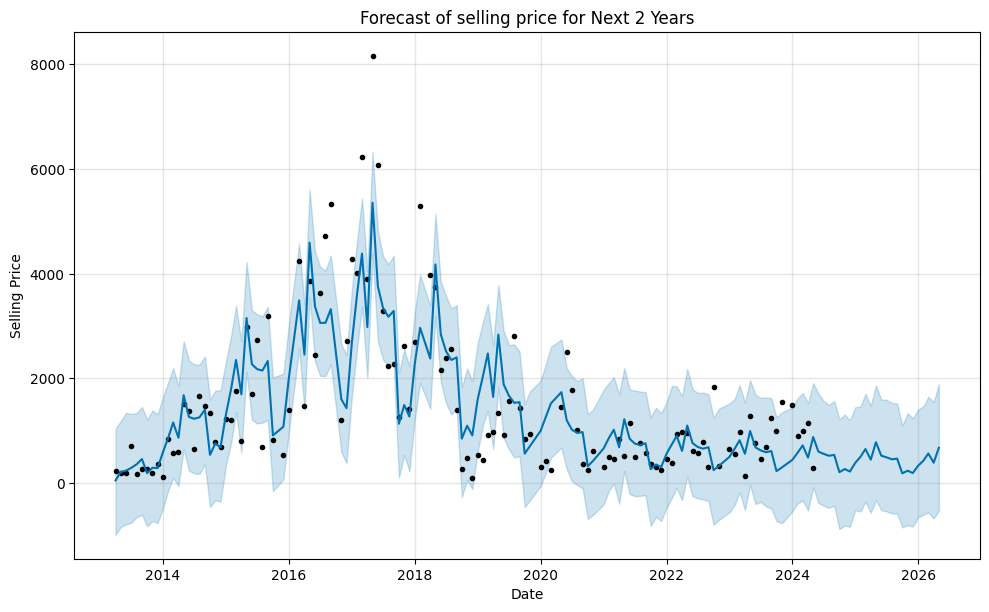

  0%|          | 0/13 [00:00<?, ?it/s]

1.3105526245674783


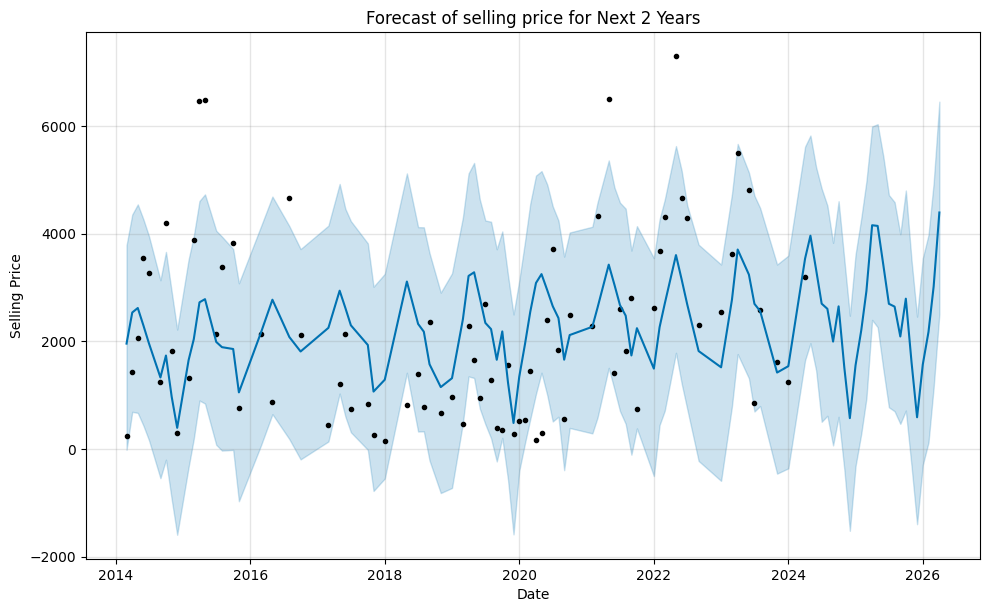

  0%|          | 0/14 [00:00<?, ?it/s]

1.171798692304127


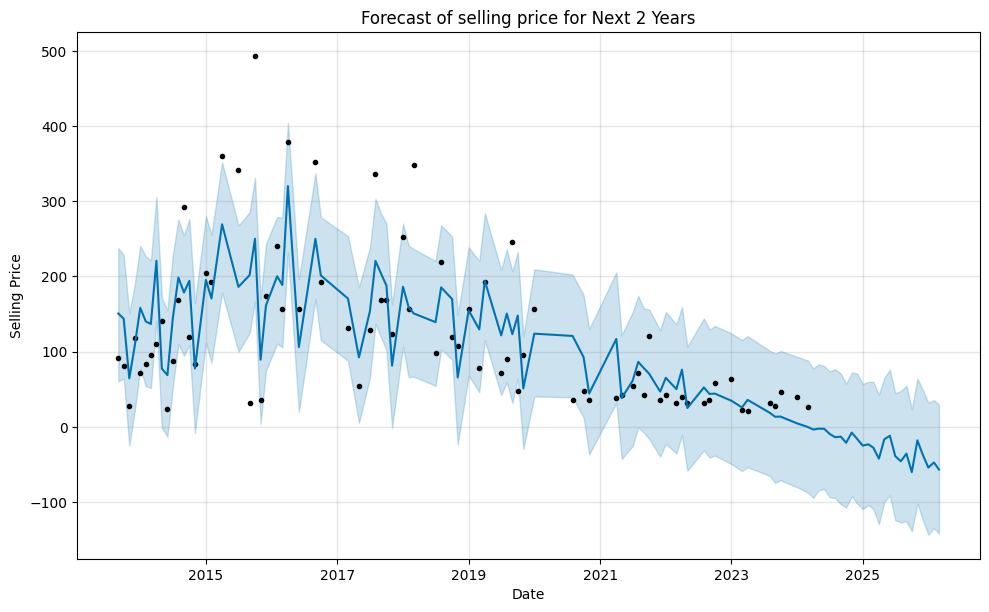

  0%|          | 0/12 [00:00<?, ?it/s]

0.7307816979751585


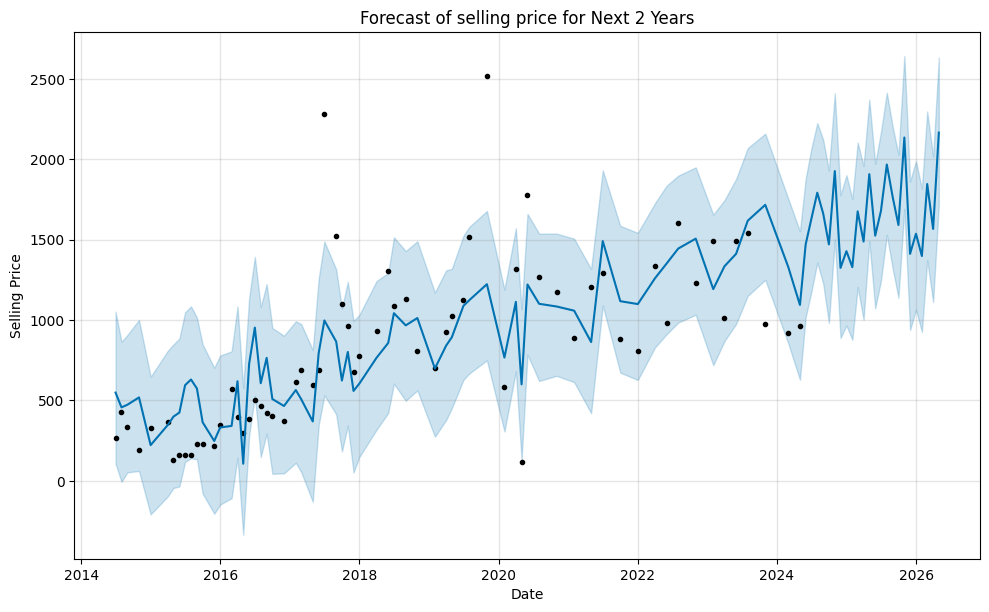

  0%|          | 0/5 [00:00<?, ?it/s]

0.5194212432235392


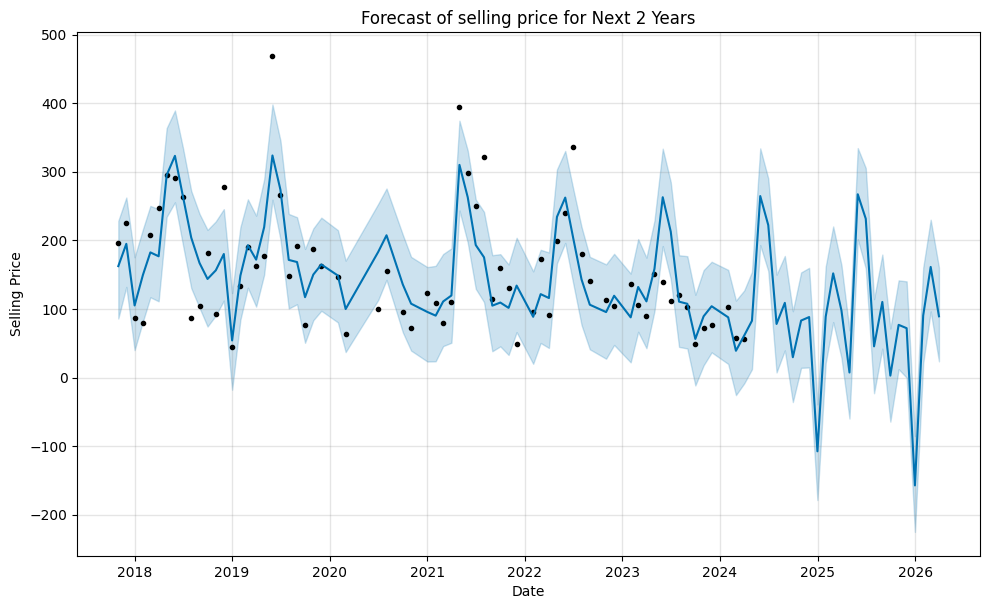

  0%|          | 0/6 [00:00<?, ?it/s]

0.5368917749141948


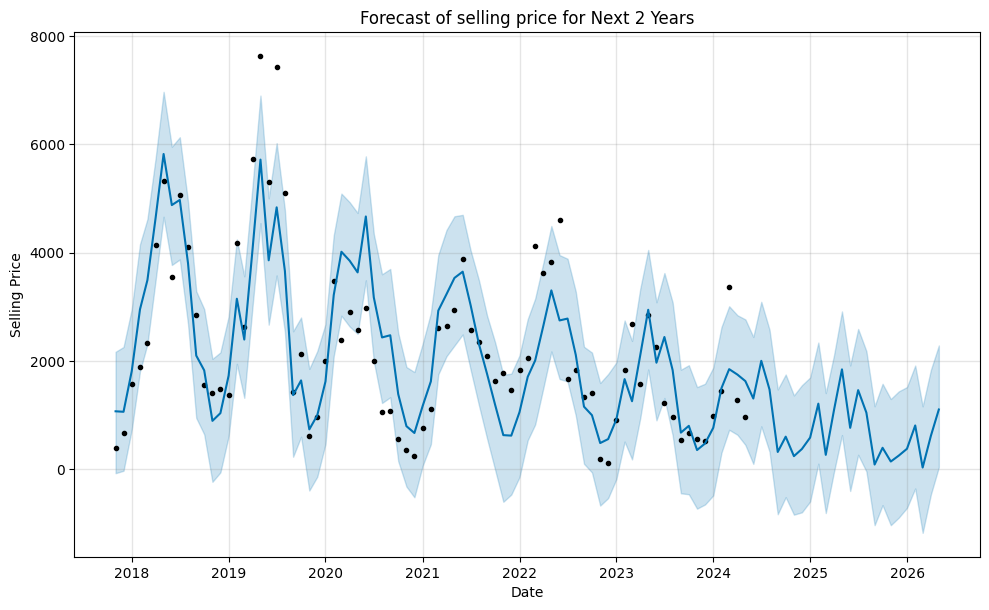

In [140]:
forecast = []
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  # model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
  model.fit(prophet_data)

  df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')
  error = performance_metrics(df_cv)["mape"].mean()
  print(error)

  future_dates = model.make_future_dataframe(periods=24, freq='M')
  curr_forecast = model.predict(future_dates)

  model.plot(curr_forecast)
  plt.title('Forecast of selling price for Next 2 Years')
  plt.xlabel('Date')
  plt.ylabel('Selling Price')
  plt.show()

  curr_forecast = curr_forecast.iloc[-24:][['ds', 'yhat']].set_index('ds').transpose()
  curr_forecast[column_name] = id
  curr_forecast = curr_forecast.rename_axis(None, axis=1)
  curr_forecast = curr_forecast.set_index(column_name)
  forecast.append(curr_forecast)

forecast = pd.concat(forecast)

In [141]:
forecast.to_csv('Company_ID_Quantity_Forecast.csv')

# Train For Country

##Filtering Data

In [143]:
column_name = 'Shipping Country'

In [144]:
unique_id = df[column_name].unique()
filtered_id = []
for id in unique_id:
  curr_df = df[df[column_name] == id]
  months_reported = curr_df['year_month'].unique()
  if len(months_reported) > 60:
    for i in months_reported:
      if pd.Period('2023-06') <= i <= pd.Period('2024-05'):
        filtered_id.append(id)
        break
len(filtered_id)

2

## Finetuing model

In [145]:
from sklearn.model_selection import ParameterGrid
param_grid = {'seasonality_mode': ["additive", 'multiplicative'],
              'seasonality_prior_scale': [1, 5, 10, 20],
              'holidays_prior_scale': [5, 10, 20, 25],
              'changepoint_prior_scale': [0.005, 0.01, 0.05, 0.1]}
grid = ParameterGrid(param_grid)
len(list(grid))

128

In [146]:
import logging

logging.getLogger("prophet").setLevel(logging.WARNING)
logging.getLogger("cmdstanpy").disabled=True

In [147]:
#Store the results
mape = {}
for id in filtered_id:

  mape[id] = []
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  #Loop
  for params in tqdm.tqdm(grid):
    #model
    model = Prophet(seasonality_mode = params['seasonality_mode'],
                seasonality_prior_scale = params['seasonality_prior_scale'],
                holidays_prior_scale = params['holidays_prior_scale'],
                changepoint_prior_scale = params['changepoint_prior_scale'])
    model.fit(curr_df)

    #CV
    df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')

    #Measure the error and store the result
    error = performance_metrics(df_cv)["mape"].mean()
    mape[id].append(error)
    print(error)

  0%|          | 0/128 [00:00<?, ?it/s]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


  0%|          | 0/15 [00:00<?, ?it/s]

  1%|          | 1/128 [00:03<06:24,  3.03s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5878238325372588


  0%|          | 0/15 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:05<05:59,  2.85s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5883338937298767


  0%|          | 0/15 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:08<06:08,  2.95s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5889794255366202


  0%|          | 0/15 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:11<06:16,  3.03s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5911317778076127


  0%|          | 0/15 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:14<06:01,  2.94s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5756731969752998


  0%|          | 0/15 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:17<05:53,  2.90s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5857830512470579


  0%|          | 0/15 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:20<05:54,  2.93s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.594672966467266


  0%|          | 0/15 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:23<05:51,  2.93s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5965041215489822


  0%|          | 0/15 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:26<05:51,  2.95s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5878238325372588


  0%|          | 0/15 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:29<05:38,  2.87s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5883338937298767


  0%|          | 0/15 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:32<05:41,  2.92s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5889794255366202


  0%|          | 0/15 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:35<05:45,  2.98s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5911317778076127


  0%|          | 0/15 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:38<05:34,  2.91s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5756731969752998


  0%|          | 0/15 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:40<05:30,  2.90s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5857830512470579


  0%|          | 0/15 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:43<05:29,  2.92s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.594672966467266


  0%|          | 0/15 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:46<05:25,  2.91s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5965041215489822


  0%|          | 0/15 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:49<05:25,  2.93s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5878238325372588


  0%|          | 0/15 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:52<05:14,  2.86s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5883338937298767


  0%|          | 0/15 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:55<05:17,  2.91s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5889794255366202


  0%|          | 0/15 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:58<05:22,  2.99s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5911317778076127


  0%|          | 0/15 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [01:01<05:11,  2.91s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5756731969752998


  0%|          | 0/15 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [01:04<05:06,  2.89s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5857830512470579


  0%|          | 0/15 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [01:07<05:08,  2.93s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.594672966467266


  0%|          | 0/15 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [01:10<05:04,  2.93s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5965041215489822


  0%|          | 0/15 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [01:13<05:03,  2.95s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5878238325372588


  0%|          | 0/15 [00:00<?, ?it/s]

 20%|██        | 26/128 [01:15<04:53,  2.88s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5883338937298767


  0%|          | 0/15 [00:00<?, ?it/s]

 21%|██        | 27/128 [01:18<04:55,  2.92s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5889794255366202


  0%|          | 0/15 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [01:22<04:59,  2.99s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5911317778076127


  0%|          | 0/15 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [01:24<04:49,  2.92s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5756731969752998


  0%|          | 0/15 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [01:27<04:43,  2.90s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.5857830512470579


  0%|          | 0/15 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [01:30<04:44,  2.93s/it]WARNING:prophet.models:Optimization terminated abnormally. Falling back to Newton.


0.594672966467266


  0%|          | 0/15 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [01:33<04:41,  2.93s/it]

0.5965041215489822


  0%|          | 0/15 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [01:36<04:28,  2.83s/it]

0.5910974929690733


  0%|          | 0/15 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [01:38<04:17,  2.74s/it]

0.590059049751433


  0%|          | 0/15 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [01:41<04:07,  2.66s/it]

0.591337765799021


  0%|          | 0/15 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [01:43<04:04,  2.65s/it]

0.592233843606129


  0%|          | 0/15 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [01:46<04:00,  2.65s/it]

0.5440205354617478


  0%|          | 0/15 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [01:49<03:58,  2.65s/it]

0.5591305447985402


  0%|          | 0/15 [00:00<?, ?it/s]

 30%|███       | 39/128 [01:51<03:53,  2.63s/it]

0.5746848988846593


  0%|          | 0/15 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [01:54<04:00,  2.73s/it]

0.5901851467737212


  0%|          | 0/15 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [01:57<03:54,  2.69s/it]

0.5910974929690733


  0%|          | 0/15 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [01:59<03:48,  2.66s/it]

0.590059049751433


  0%|          | 0/15 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [02:02<03:41,  2.60s/it]

0.591337765799021


  0%|          | 0/15 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [02:04<03:38,  2.60s/it]

0.592233843606129


  0%|          | 0/15 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [02:07<03:35,  2.60s/it]

0.5440205354617478


  0%|          | 0/15 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [02:10<03:33,  2.61s/it]

0.5591305447985402


  0%|          | 0/15 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [02:12<03:30,  2.60s/it]

0.5746848988846593


  0%|          | 0/15 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [02:15<03:35,  2.70s/it]

0.5901851467737212


  0%|          | 0/15 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [02:18<03:30,  2.66s/it]

0.5910974929690733


  0%|          | 0/15 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [02:20<03:24,  2.63s/it]

0.590059049751433


  0%|          | 0/15 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [02:23<03:18,  2.58s/it]

0.591337765799021


  0%|          | 0/15 [00:00<?, ?it/s]

 41%|████      | 52/128 [02:25<03:15,  2.58s/it]

0.592233843606129


  0%|          | 0/15 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [02:28<03:14,  2.60s/it]

0.5440205354617478


  0%|          | 0/15 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [02:31<03:19,  2.69s/it]

0.5591305447985402


  0%|          | 0/15 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [02:34<03:14,  2.66s/it]

0.5746848988846593


  0%|          | 0/15 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [02:36<03:17,  2.75s/it]

0.5901851467737212


  0%|          | 0/15 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [02:39<03:12,  2.71s/it]

0.5910974929690733


  0%|          | 0/15 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [02:42<03:06,  2.66s/it]

0.590059049751433


  0%|          | 0/15 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [02:44<02:59,  2.60s/it]

0.591337765799021


  0%|          | 0/15 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [02:47<02:56,  2.59s/it]

0.592233843606129


  0%|          | 0/15 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [02:49<02:54,  2.60s/it]

0.5440205354617478


  0%|          | 0/15 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [02:52<02:52,  2.62s/it]

0.5591305447985402


  0%|          | 0/15 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [02:55<02:49,  2.61s/it]

0.5746848988846593


  0%|          | 0/15 [00:00<?, ?it/s]

 50%|█████     | 64/128 [02:57<02:52,  2.70s/it]

0.5901851467737212


  0%|          | 0/15 [00:00<?, ?it/s]

 51%|█████     | 65/128 [03:00<02:53,  2.75s/it]

0.5415134120793806


  0%|          | 0/15 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [03:03<02:52,  2.77s/it]

0.5488254948805223


  0%|          | 0/15 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [03:06<02:48,  2.77s/it]

0.5500878761170547


  0%|          | 0/15 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [03:09<02:46,  2.77s/it]

0.5522714533190164


  0%|          | 0/15 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [03:12<02:47,  2.84s/it]

0.507697062317334


  0%|          | 0/15 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [03:15<02:45,  2.86s/it]

0.5173434204987967


  0%|          | 0/15 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [03:17<02:40,  2.82s/it]

0.5233065109708663


  0%|          | 0/15 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [03:20<02:43,  2.92s/it]

0.5247581324597581


  0%|          | 0/15 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [03:23<02:39,  2.90s/it]

0.5415134120793806


  0%|          | 0/15 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [03:26<02:35,  2.88s/it]

0.5488254948805223


  0%|          | 0/15 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [03:29<02:30,  2.85s/it]

0.5500878761170547


  0%|          | 0/15 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [03:32<02:27,  2.83s/it]

0.5522714533190164


  0%|          | 0/15 [00:00<?, ?it/s]

 60%|██████    | 77/128 [03:35<02:27,  2.89s/it]

0.507697062317334


  0%|          | 0/15 [00:00<?, ?it/s]

 61%|██████    | 78/128 [03:38<02:24,  2.89s/it]

0.5173434204987967


  0%|          | 0/15 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [03:40<02:19,  2.85s/it]

0.5233065109708663


  0%|          | 0/15 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [03:44<02:20,  2.93s/it]

0.5247581324597581


  0%|          | 0/15 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [03:46<02:16,  2.91s/it]

0.5415134120793806


  0%|          | 0/15 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [03:49<02:12,  2.89s/it]

0.5488254948805223


  0%|          | 0/15 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [03:52<02:08,  2.85s/it]

0.5500878761170547


  0%|          | 0/15 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [03:55<02:04,  2.83s/it]

0.5522714533190164


  0%|          | 0/15 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [03:58<02:04,  2.89s/it]

0.507697062317334


  0%|          | 0/15 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [04:01<02:01,  2.90s/it]

0.5173434204987967


  0%|          | 0/15 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [04:03<01:57,  2.86s/it]

0.5233065109708663


  0%|          | 0/15 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [04:07<01:57,  2.94s/it]

0.5247581324597581


  0%|          | 0/15 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [04:09<01:53,  2.92s/it]

0.5415134120793806


  0%|          | 0/15 [00:00<?, ?it/s]

 70%|███████   | 90/128 [04:12<01:49,  2.89s/it]

0.5488254948805223


  0%|          | 0/15 [00:00<?, ?it/s]

 71%|███████   | 91/128 [04:15<01:45,  2.85s/it]

0.5500878761170547


  0%|          | 0/15 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [04:18<01:41,  2.83s/it]

0.5522714533190164


  0%|          | 0/15 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [04:21<01:40,  2.89s/it]

0.507697062317334


  0%|          | 0/15 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [04:24<01:38,  2.89s/it]

0.5173434204987967


  0%|          | 0/15 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [04:26<01:34,  2.85s/it]

0.5233065109708663


  0%|          | 0/15 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [04:30<01:34,  2.94s/it]

0.5247581324597581


  0%|          | 0/15 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [04:33<01:35,  3.07s/it]

0.4786337944875484


  0%|          | 0/15 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [04:36<01:32,  3.09s/it]

0.4794540834301337


  0%|          | 0/15 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [04:39<01:29,  3.08s/it]

0.47256085777601636


  0%|          | 0/15 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [04:43<01:28,  3.15s/it]

0.48259801502670535


  0%|          | 0/15 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [04:46<01:26,  3.21s/it]

0.48769519972696906


  0%|          | 0/15 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [04:49<01:23,  3.23s/it]

0.4997346555275085


  0%|          | 0/15 [00:00<?, ?it/s]

 80%|████████  | 103/128 [04:52<01:20,  3.21s/it]

0.5001231366115942


  0%|          | 0/15 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [04:56<01:19,  3.31s/it]

0.5029577549686896


  0%|          | 0/15 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [04:59<01:16,  3.32s/it]

0.4786337944875484


  0%|          | 0/15 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [05:02<01:11,  3.27s/it]

0.4794540834301337


  0%|          | 0/15 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [05:05<01:07,  3.22s/it]

0.47256085777601636


  0%|          | 0/15 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [05:09<01:04,  3.24s/it]

0.48259801502670535


  0%|          | 0/15 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [05:12<01:02,  3.28s/it]

0.48769519972696906


  0%|          | 0/15 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [05:15<00:59,  3.29s/it]

0.4997346555275085


  0%|          | 0/15 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [05:19<00:55,  3.26s/it]

0.5001231366115942


  0%|          | 0/15 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [05:22<00:53,  3.34s/it]

0.5029577549686896


  0%|          | 0/15 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [05:26<00:51,  3.45s/it]

0.4786337944875484


  0%|          | 0/15 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [05:29<00:47,  3.37s/it]

0.4794540834301337


  0%|          | 0/15 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [05:32<00:42,  3.28s/it]

0.47256085777601636


  0%|          | 0/15 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [05:35<00:39,  3.29s/it]

0.48259801502670535


  0%|          | 0/15 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [05:39<00:36,  3.31s/it]

0.48769519972696906


  0%|          | 0/15 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [05:42<00:32,  3.29s/it]

0.4997346555275085


  0%|          | 0/15 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [05:45<00:29,  3.24s/it]

0.5001231366115942


  0%|          | 0/15 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [05:49<00:26,  3.33s/it]

0.5029577549686896


  0%|          | 0/15 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [05:52<00:23,  3.34s/it]

0.4786337944875484


  0%|          | 0/15 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [05:55<00:19,  3.29s/it]

0.4794540834301337


  0%|          | 0/15 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [05:58<00:16,  3.22s/it]

0.47256085777601636


  0%|          | 0/15 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [06:02<00:12,  3.25s/it]

0.48259801502670535


  0%|          | 0/15 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [06:05<00:09,  3.29s/it]

0.48769519972696906


  0%|          | 0/15 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [06:08<00:06,  3.28s/it]

0.4997346555275085


  0%|          | 0/15 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [06:11<00:03,  3.24s/it]

0.5001231366115942


  0%|          | 0/15 [00:00<?, ?it/s]

100%|██████████| 128/128 [06:15<00:00,  2.93s/it]


0.5029577549686896


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  1%|          | 1/128 [00:01<03:44,  1.77s/it]

0.733246766605671


  0%|          | 0/12 [00:00<?, ?it/s]

  2%|▏         | 2/128 [00:03<04:12,  2.00s/it]

0.7405506708782063


  0%|          | 0/12 [00:00<?, ?it/s]

  2%|▏         | 3/128 [00:05<03:59,  1.92s/it]

0.7378247486716775


  0%|          | 0/12 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:07<03:59,  1.93s/it]

0.741809666588279


  0%|          | 0/12 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:09<03:50,  1.87s/it]

0.7538104729697077


  0%|          | 0/12 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:11<03:56,  1.94s/it]

0.768247926184991


  0%|          | 0/12 [00:00<?, ?it/s]

  5%|▌         | 7/128 [00:13<03:49,  1.90s/it]

0.7747915115906322


  0%|          | 0/12 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:15<03:50,  1.92s/it]

0.8066066133419851


  0%|          | 0/12 [00:00<?, ?it/s]

  7%|▋         | 9/128 [00:17<03:43,  1.88s/it]

0.733246766605671


  0%|          | 0/12 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:19<03:52,  1.97s/it]

0.7405506708782063


  0%|          | 0/12 [00:00<?, ?it/s]

  9%|▊         | 11/128 [00:21<03:46,  1.94s/it]

0.7378247486716775


  0%|          | 0/12 [00:00<?, ?it/s]

  9%|▉         | 12/128 [00:23<03:43,  1.93s/it]

0.741809666588279


  0%|          | 0/12 [00:00<?, ?it/s]

 10%|█         | 13/128 [00:24<03:35,  1.87s/it]

0.7538104729697077


  0%|          | 0/12 [00:00<?, ?it/s]

 11%|█         | 14/128 [00:26<03:40,  1.93s/it]

0.768247926184991


  0%|          | 0/12 [00:00<?, ?it/s]

 12%|█▏        | 15/128 [00:28<03:34,  1.90s/it]

0.7747915115906322


  0%|          | 0/12 [00:00<?, ?it/s]

 12%|█▎        | 16/128 [00:30<03:35,  1.93s/it]

0.8066066133419851


  0%|          | 0/12 [00:00<?, ?it/s]

 13%|█▎        | 17/128 [00:32<03:29,  1.89s/it]

0.733246766605671


  0%|          | 0/12 [00:00<?, ?it/s]

 14%|█▍        | 18/128 [00:34<03:37,  1.98s/it]

0.7405506708782063


  0%|          | 0/12 [00:00<?, ?it/s]

 15%|█▍        | 19/128 [00:36<03:30,  1.93s/it]

0.7378247486716775


  0%|          | 0/12 [00:00<?, ?it/s]

 16%|█▌        | 20/128 [00:38<03:29,  1.94s/it]

0.741809666588279


  0%|          | 0/12 [00:00<?, ?it/s]

 16%|█▋        | 21/128 [00:40<03:22,  1.89s/it]

0.7538104729697077


  0%|          | 0/12 [00:00<?, ?it/s]

 17%|█▋        | 22/128 [00:42<03:26,  1.95s/it]

0.768247926184991


  0%|          | 0/12 [00:00<?, ?it/s]

 18%|█▊        | 23/128 [00:44<03:21,  1.92s/it]

0.7747915115906322


  0%|          | 0/12 [00:00<?, ?it/s]

 19%|█▉        | 24/128 [00:46<03:21,  1.93s/it]

0.8066066133419851


  0%|          | 0/12 [00:00<?, ?it/s]

 20%|█▉        | 25/128 [00:47<03:13,  1.88s/it]

0.733246766605671


  0%|          | 0/12 [00:00<?, ?it/s]

 20%|██        | 26/128 [00:50<03:20,  1.97s/it]

0.7405506708782063


  0%|          | 0/12 [00:00<?, ?it/s]

 21%|██        | 27/128 [00:51<03:14,  1.93s/it]

0.7378247486716775


  0%|          | 0/12 [00:00<?, ?it/s]

 22%|██▏       | 28/128 [00:53<03:14,  1.94s/it]

0.741809666588279


  0%|          | 0/12 [00:00<?, ?it/s]

 23%|██▎       | 29/128 [00:55<03:06,  1.89s/it]

0.7538104729697077


  0%|          | 0/12 [00:00<?, ?it/s]

 23%|██▎       | 30/128 [00:57<03:10,  1.94s/it]

0.768247926184991


  0%|          | 0/12 [00:00<?, ?it/s]

 24%|██▍       | 31/128 [00:59<03:04,  1.91s/it]

0.7747915115906322


  0%|          | 0/12 [00:00<?, ?it/s]

 25%|██▌       | 32/128 [01:01<03:04,  1.92s/it]

0.8066066133419851


  0%|          | 0/12 [00:00<?, ?it/s]

 26%|██▌       | 33/128 [01:03<03:02,  1.92s/it]

0.7283472919992983


  0%|          | 0/12 [00:00<?, ?it/s]

 27%|██▋       | 34/128 [01:05<02:57,  1.89s/it]

0.7418702995680387


  0%|          | 0/12 [00:00<?, ?it/s]

 27%|██▋       | 35/128 [01:07<02:53,  1.87s/it]

0.7443501861399832


  0%|          | 0/12 [00:00<?, ?it/s]

 28%|██▊       | 36/128 [01:08<02:54,  1.89s/it]

0.745116954339504


  0%|          | 0/12 [00:00<?, ?it/s]

 29%|██▉       | 37/128 [01:10<02:52,  1.89s/it]

0.7540475133744412


  0%|          | 0/12 [00:00<?, ?it/s]

 30%|██▉       | 38/128 [01:12<02:56,  1.96s/it]

0.7611532074961908


  0%|          | 0/12 [00:00<?, ?it/s]

 30%|███       | 39/128 [01:14<02:54,  1.96s/it]

0.7820576695238493


  0%|          | 0/12 [00:00<?, ?it/s]

 31%|███▏      | 40/128 [01:16<02:54,  1.98s/it]

0.8126117614685565


  0%|          | 0/12 [00:00<?, ?it/s]

 32%|███▏      | 41/128 [01:18<02:49,  1.95s/it]

0.7283472919992983


  0%|          | 0/12 [00:00<?, ?it/s]

 33%|███▎      | 42/128 [01:20<02:43,  1.90s/it]

0.7418702995680387


  0%|          | 0/12 [00:00<?, ?it/s]

 34%|███▎      | 43/128 [01:22<02:38,  1.87s/it]

0.7443501861399832


  0%|          | 0/12 [00:00<?, ?it/s]

 34%|███▍      | 44/128 [01:24<02:39,  1.90s/it]

0.745116954339504


  0%|          | 0/12 [00:00<?, ?it/s]

 35%|███▌      | 45/128 [01:26<02:36,  1.89s/it]

0.7540475133744412


  0%|          | 0/12 [00:00<?, ?it/s]

 36%|███▌      | 46/128 [01:28<02:41,  1.97s/it]

0.7611532074961908


  0%|          | 0/12 [00:00<?, ?it/s]

 37%|███▋      | 47/128 [01:30<02:39,  1.96s/it]

0.7820576695238493


  0%|          | 0/12 [00:00<?, ?it/s]

 38%|███▊      | 48/128 [01:32<02:38,  1.98s/it]

0.8126117614685565


  0%|          | 0/12 [00:00<?, ?it/s]

 38%|███▊      | 49/128 [01:34<02:34,  1.95s/it]

0.7283472919992983


  0%|          | 0/12 [00:00<?, ?it/s]

 39%|███▉      | 50/128 [01:36<02:28,  1.91s/it]

0.7418702995680387


  0%|          | 0/12 [00:00<?, ?it/s]

 40%|███▉      | 51/128 [01:37<02:25,  1.88s/it]

0.7443501861399832


  0%|          | 0/12 [00:00<?, ?it/s]

 41%|████      | 52/128 [01:39<02:25,  1.91s/it]

0.745116954339504


  0%|          | 0/12 [00:00<?, ?it/s]

 41%|████▏     | 53/128 [01:41<02:22,  1.91s/it]

0.7540475133744412


  0%|          | 0/12 [00:00<?, ?it/s]

 42%|████▏     | 54/128 [01:43<02:26,  1.98s/it]

0.7611532074961908


  0%|          | 0/12 [00:00<?, ?it/s]

 43%|████▎     | 55/128 [01:45<02:23,  1.97s/it]

0.7820576695238493


  0%|          | 0/12 [00:00<?, ?it/s]

 44%|████▍     | 56/128 [01:47<02:22,  1.98s/it]

0.8126117614685565


  0%|          | 0/12 [00:00<?, ?it/s]

 45%|████▍     | 57/128 [01:50<02:26,  2.06s/it]

0.7283472919992983


  0%|          | 0/12 [00:00<?, ?it/s]

 45%|████▌     | 58/128 [01:51<02:19,  1.99s/it]

0.7418702995680387


  0%|          | 0/12 [00:00<?, ?it/s]

 46%|████▌     | 59/128 [01:53<02:13,  1.94s/it]

0.7443501861399832


  0%|          | 0/12 [00:00<?, ?it/s]

 47%|████▋     | 60/128 [01:55<02:12,  1.95s/it]

0.745116954339504


  0%|          | 0/12 [00:00<?, ?it/s]

 48%|████▊     | 61/128 [01:57<02:09,  1.93s/it]

0.7540475133744412


  0%|          | 0/12 [00:00<?, ?it/s]

 48%|████▊     | 62/128 [01:59<02:11,  2.00s/it]

0.7611532074961908


  0%|          | 0/12 [00:00<?, ?it/s]

 49%|████▉     | 63/128 [02:01<02:09,  1.99s/it]

0.7820576695238493


  0%|          | 0/12 [00:00<?, ?it/s]

 50%|█████     | 64/128 [02:03<02:08,  2.00s/it]

0.8126117614685565


  0%|          | 0/12 [00:00<?, ?it/s]

 51%|█████     | 65/128 [02:06<02:12,  2.10s/it]

0.7317802812175344


  0%|          | 0/12 [00:00<?, ?it/s]

 52%|█████▏    | 66/128 [02:08<02:15,  2.19s/it]

0.7406348495333765


  0%|          | 0/12 [00:00<?, ?it/s]

 52%|█████▏    | 67/128 [02:11<02:21,  2.31s/it]

0.7433854337441252


  0%|          | 0/12 [00:00<?, ?it/s]

 53%|█████▎    | 68/128 [02:13<02:19,  2.33s/it]

0.744736732647601


  0%|          | 0/12 [00:00<?, ?it/s]

 54%|█████▍    | 69/128 [02:15<02:20,  2.38s/it]

0.8141979813969243


  0%|          | 0/12 [00:00<?, ?it/s]

 55%|█████▍    | 70/128 [02:18<02:20,  2.43s/it]

0.8696371221524328


  0%|          | 0/12 [00:00<?, ?it/s]

 55%|█████▌    | 71/128 [02:21<02:24,  2.53s/it]

0.9020982102624502


  0%|          | 0/12 [00:00<?, ?it/s]

 56%|█████▋    | 72/128 [02:23<02:23,  2.55s/it]

0.816957200807719


  0%|          | 0/12 [00:00<?, ?it/s]

 57%|█████▋    | 73/128 [02:26<02:16,  2.48s/it]

0.7317802812175344


  0%|          | 0/12 [00:00<?, ?it/s]

 58%|█████▊    | 74/128 [02:28<02:12,  2.46s/it]

0.7406348495333765


  0%|          | 0/12 [00:00<?, ?it/s]

 59%|█████▊    | 75/128 [02:31<02:12,  2.50s/it]

0.7433854337441252


  0%|          | 0/12 [00:00<?, ?it/s]

 59%|█████▉    | 76/128 [02:33<02:07,  2.46s/it]

0.744736732647601


  0%|          | 0/12 [00:00<?, ?it/s]

 60%|██████    | 77/128 [02:36<02:05,  2.47s/it]

0.8141979813969243


  0%|          | 0/12 [00:00<?, ?it/s]

 61%|██████    | 78/128 [02:38<02:04,  2.49s/it]

0.8696371221524328


  0%|          | 0/12 [00:00<?, ?it/s]

 62%|██████▏   | 79/128 [02:41<02:05,  2.57s/it]

0.9020982102624502


  0%|          | 0/12 [00:00<?, ?it/s]

 62%|██████▎   | 80/128 [02:43<02:03,  2.58s/it]

0.816957200807719


  0%|          | 0/12 [00:00<?, ?it/s]

 63%|██████▎   | 81/128 [02:46<01:57,  2.51s/it]

0.7317802812175344


  0%|          | 0/12 [00:00<?, ?it/s]

 64%|██████▍   | 82/128 [02:48<01:53,  2.48s/it]

0.7406348495333765


  0%|          | 0/12 [00:00<?, ?it/s]

 65%|██████▍   | 83/128 [02:51<01:53,  2.52s/it]

0.7433854337441252


  0%|          | 0/12 [00:00<?, ?it/s]

 66%|██████▌   | 84/128 [02:53<01:48,  2.47s/it]

0.744736732647601


  0%|          | 0/12 [00:00<?, ?it/s]

 66%|██████▋   | 85/128 [02:56<01:46,  2.47s/it]

0.8141979813969243


  0%|          | 0/12 [00:00<?, ?it/s]

 67%|██████▋   | 86/128 [02:58<01:45,  2.50s/it]

0.8696371221524328


  0%|          | 0/12 [00:00<?, ?it/s]

 68%|██████▊   | 87/128 [03:01<01:45,  2.58s/it]

0.9020982102624502


  0%|          | 0/12 [00:00<?, ?it/s]

 69%|██████▉   | 88/128 [03:04<01:43,  2.59s/it]

0.816957200807719


  0%|          | 0/12 [00:00<?, ?it/s]

 70%|██████▉   | 89/128 [03:06<01:38,  2.52s/it]

0.7317802812175344


  0%|          | 0/12 [00:00<?, ?it/s]

 70%|███████   | 90/128 [03:08<01:34,  2.49s/it]

0.7406348495333765


  0%|          | 0/12 [00:00<?, ?it/s]

 71%|███████   | 91/128 [03:11<01:33,  2.52s/it]

0.7433854337441252


  0%|          | 0/12 [00:00<?, ?it/s]

 72%|███████▏  | 92/128 [03:13<01:29,  2.48s/it]

0.744736732647601


  0%|          | 0/12 [00:00<?, ?it/s]

 73%|███████▎  | 93/128 [03:16<01:26,  2.47s/it]

0.8141979813969243


  0%|          | 0/12 [00:00<?, ?it/s]

 73%|███████▎  | 94/128 [03:18<01:24,  2.49s/it]

0.8696371221524328


  0%|          | 0/12 [00:00<?, ?it/s]

 74%|███████▍  | 95/128 [03:21<01:25,  2.58s/it]

0.9020982102624502


  0%|          | 0/12 [00:00<?, ?it/s]

 75%|███████▌  | 96/128 [03:24<01:22,  2.58s/it]

0.816957200807719


  0%|          | 0/12 [00:00<?, ?it/s]

 76%|███████▌  | 97/128 [03:26<01:21,  2.61s/it]

0.7332115969729958


  0%|          | 0/12 [00:00<?, ?it/s]

 77%|███████▋  | 98/128 [03:29<01:20,  2.68s/it]

0.7433400062927863


  0%|          | 0/12 [00:00<?, ?it/s]

 77%|███████▋  | 99/128 [03:32<01:20,  2.78s/it]

0.7340383782476447


  0%|          | 0/12 [00:00<?, ?it/s]

 78%|███████▊  | 100/128 [03:35<01:18,  2.79s/it]

0.7451467741918086


  0%|          | 0/12 [00:00<?, ?it/s]

 79%|███████▉  | 101/128 [03:38<01:16,  2.84s/it]

0.8742809457162458


  0%|          | 0/12 [00:00<?, ?it/s]

 80%|███████▉  | 102/128 [03:41<01:13,  2.82s/it]

0.8562290740908516


  0%|          | 0/12 [00:00<?, ?it/s]

 80%|████████  | 103/128 [03:44<01:12,  2.88s/it]

0.8754425563045092


  0%|          | 0/12 [00:00<?, ?it/s]

 81%|████████▏ | 104/128 [03:47<01:10,  2.92s/it]

0.8939699150361828


  0%|          | 0/12 [00:00<?, ?it/s]

 82%|████████▏ | 105/128 [03:50<01:05,  2.85s/it]

0.7332115969729958


  0%|          | 0/12 [00:00<?, ?it/s]

 83%|████████▎ | 106/128 [03:52<01:02,  2.84s/it]

0.7433400062927863


  0%|          | 0/12 [00:00<?, ?it/s]

 84%|████████▎ | 107/128 [03:55<01:00,  2.90s/it]

0.7340383782476447


  0%|          | 0/12 [00:00<?, ?it/s]

 84%|████████▍ | 108/128 [03:58<00:57,  2.88s/it]

0.7451467741918086


  0%|          | 0/12 [00:00<?, ?it/s]

 85%|████████▌ | 109/128 [04:01<00:55,  2.91s/it]

0.8742809457162458


  0%|          | 0/12 [00:00<?, ?it/s]

 86%|████████▌ | 110/128 [04:04<00:51,  2.87s/it]

0.8562290740908516


  0%|          | 0/12 [00:00<?, ?it/s]

 87%|████████▋ | 111/128 [04:07<00:49,  2.90s/it]

0.8754425563045092


  0%|          | 0/12 [00:00<?, ?it/s]

 88%|████████▊ | 112/128 [04:10<00:46,  2.93s/it]

0.8939699150361828


  0%|          | 0/12 [00:00<?, ?it/s]

 88%|████████▊ | 113/128 [04:13<00:42,  2.86s/it]

0.7332115969729958


  0%|          | 0/12 [00:00<?, ?it/s]

 89%|████████▉ | 114/128 [04:15<00:39,  2.85s/it]

0.7433400062927863


  0%|          | 0/12 [00:00<?, ?it/s]

 90%|████████▉ | 115/128 [04:19<00:37,  2.90s/it]

0.7340383782476447


  0%|          | 0/12 [00:00<?, ?it/s]

 91%|█████████ | 116/128 [04:21<00:34,  2.88s/it]

0.7451467741918086


  0%|          | 0/12 [00:00<?, ?it/s]

 91%|█████████▏| 117/128 [04:24<00:31,  2.90s/it]

0.8742809457162458


  0%|          | 0/12 [00:00<?, ?it/s]

 92%|█████████▏| 118/128 [04:27<00:28,  2.86s/it]

0.8562290740908516


  0%|          | 0/12 [00:00<?, ?it/s]

 93%|█████████▎| 119/128 [04:30<00:26,  2.90s/it]

0.8754425563045092


  0%|          | 0/12 [00:00<?, ?it/s]

 94%|█████████▍| 120/128 [04:33<00:23,  2.93s/it]

0.8939699150361828


  0%|          | 0/12 [00:00<?, ?it/s]

 95%|█████████▍| 121/128 [04:36<00:19,  2.85s/it]

0.7332115969729958


  0%|          | 0/12 [00:00<?, ?it/s]

 95%|█████████▌| 122/128 [04:39<00:17,  2.85s/it]

0.7433400062927863


  0%|          | 0/12 [00:00<?, ?it/s]

 96%|█████████▌| 123/128 [04:42<00:14,  2.90s/it]

0.7340383782476447


  0%|          | 0/12 [00:00<?, ?it/s]

 97%|█████████▋| 124/128 [04:44<00:11,  2.87s/it]

0.7451467741918086


  0%|          | 0/12 [00:00<?, ?it/s]

 98%|█████████▊| 125/128 [04:47<00:08,  2.89s/it]

0.8742809457162458


  0%|          | 0/12 [00:00<?, ?it/s]

 98%|█████████▊| 126/128 [04:50<00:05,  2.85s/it]

0.8562290740908516


  0%|          | 0/12 [00:00<?, ?it/s]

 99%|█████████▉| 127/128 [04:53<00:02,  2.90s/it]

0.8754425563045092


  0%|          | 0/12 [00:00<?, ?it/s]

100%|██████████| 128/128 [04:56<00:00,  2.32s/it]

0.8939699150361828


In [148]:
import pickle
with open('country_quantity_fine_tune_result.pkl', 'wb') as file:
  pickle.dump(mape, file)

In [149]:
best_params = {}
for id in filtered_id:
  tuning_results = pd.DataFrame(grid)
  tuning_results['mape'] = mape[id]
  best_params[id] = tuning_results[tuning_results.mape == tuning_results.mape.min()].transpose()

##Forecasting

  0%|          | 0/15 [00:00<?, ?it/s]

0.47256085777601636


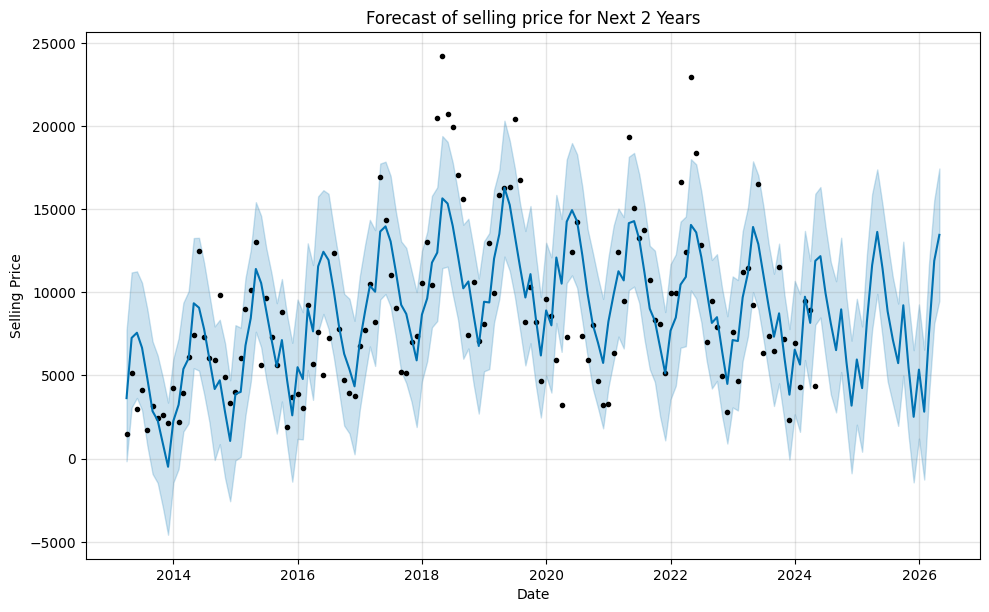

  0%|          | 0/12 [00:00<?, ?it/s]

0.7283472919992983


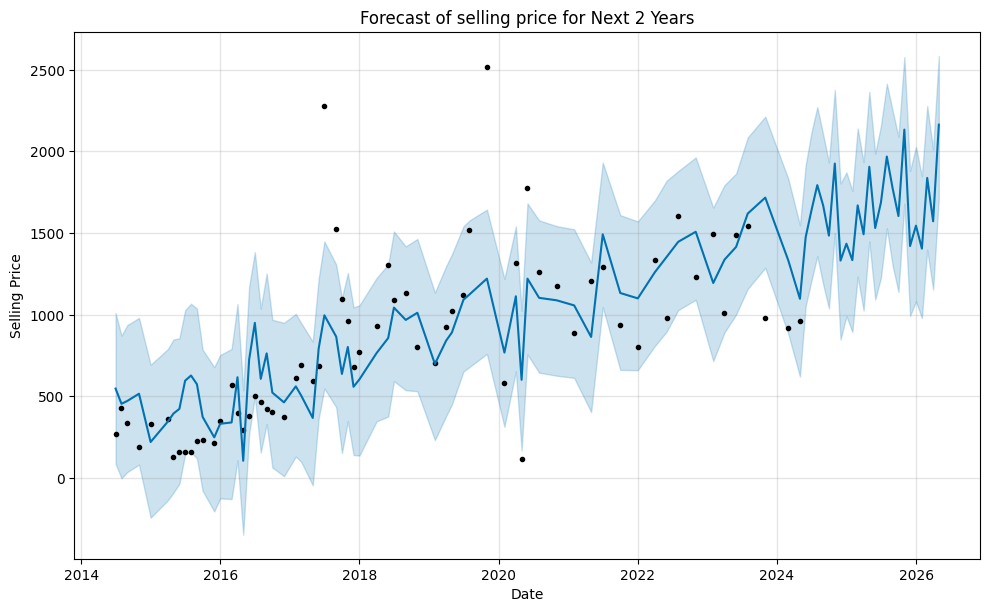

In [150]:
forecast = []
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  # model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
  model.fit(prophet_data)

  df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')
  error = performance_metrics(df_cv)["mape"].mean()
  print(error)

  future_dates = model.make_future_dataframe(periods=24, freq='M')
  curr_forecast = model.predict(future_dates)

  model.plot(curr_forecast)
  plt.title('Forecast of selling price for Next 2 Years')
  plt.xlabel('Date')
  plt.ylabel('Selling Price')
  plt.show()

  curr_forecast = curr_forecast.iloc[-24:][['ds', 'yhat']].set_index('ds').transpose()
  curr_forecast[column_name] = id
  curr_forecast = curr_forecast.rename_axis(None, axis=1)
  curr_forecast = curr_forecast.set_index(column_name)
  forecast.append(curr_forecast)

forecast = pd.concat(forecast)

In [151]:
forecast.to_csv('Shipping_Country_Quantity_Forecast.csv')

#Plot & Result

In [17]:
param_grid = {'seasonality_mode': ["additive", 'multiplicative'],
              'seasonality_prior_scale': [1, 5, 10, 20],
              'holidays_prior_scale': [5, 10, 20, 25],
              'changepoint_prior_scale': [0.005, 0.01, 0.05, 0.1]}
grid = ParameterGrid(param_grid)
len(list(grid))

128

##Company ID

In [9]:
column_name = 'Company ID'

In [10]:
unique_id = df[column_name].unique()
filtered_id = []
for id in unique_id:
  curr_df = df[df[column_name] == id]
  months_reported = curr_df['year_month'].unique()
  if len(months_reported) > 60:
    for i in months_reported:
      if pd.Period('2023-06') <= i <= pd.Period('2024-05'):
        filtered_id.append(id)
        break
len(filtered_id)

6

###Selling Price

In [18]:
with open('company_fine_tune_result.pkl', 'rb') as file:
  mape = pickle.load(file)
best_params = {}
for id in filtered_id:
  tuning_results = pd.DataFrame(grid)
  tuning_results['mape'] = mape[id]
  best_params[id] = tuning_results[tuning_results.mape == tuning_results.mape.min()].transpose()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/omabxx15.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/8kcmnd_c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63779', 'data', 'file=/tmp/tmpco321nsp/omabxx15.json', 'init=/tmp/tmpco321nsp/8kcmnd_c.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modeltcfwch5r/prophet_model-20240519181454.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:14:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:14:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

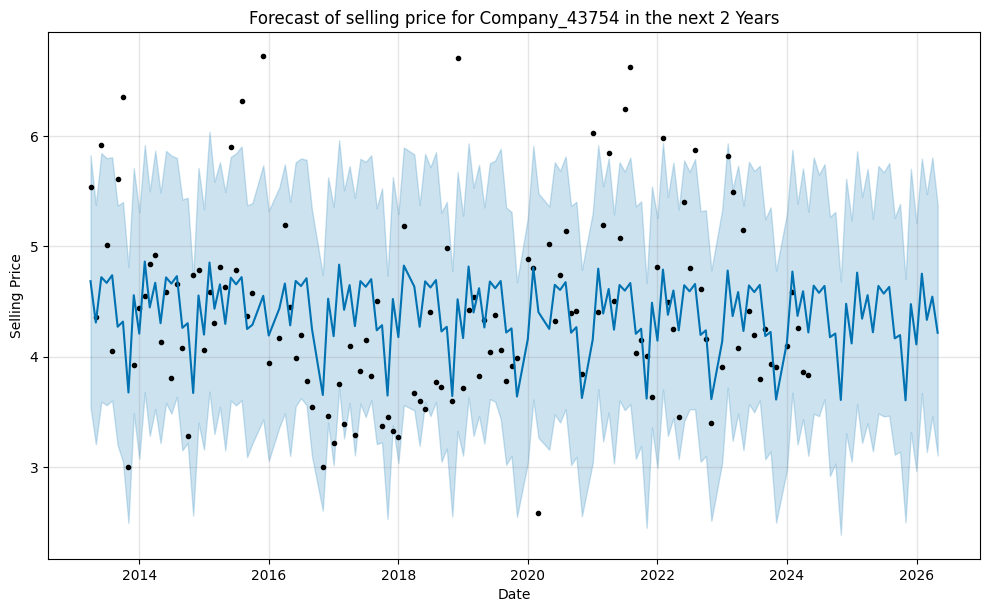

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/tqos1v0g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/pgs75cwa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16319', 'data', 'file=/tmp/tmpco321nsp/tqos1v0g.json', 'init=/tmp/tmpco321nsp/pgs75cwa.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modelibpe_ewx/prophet_model-20240519181454.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:14:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:14:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

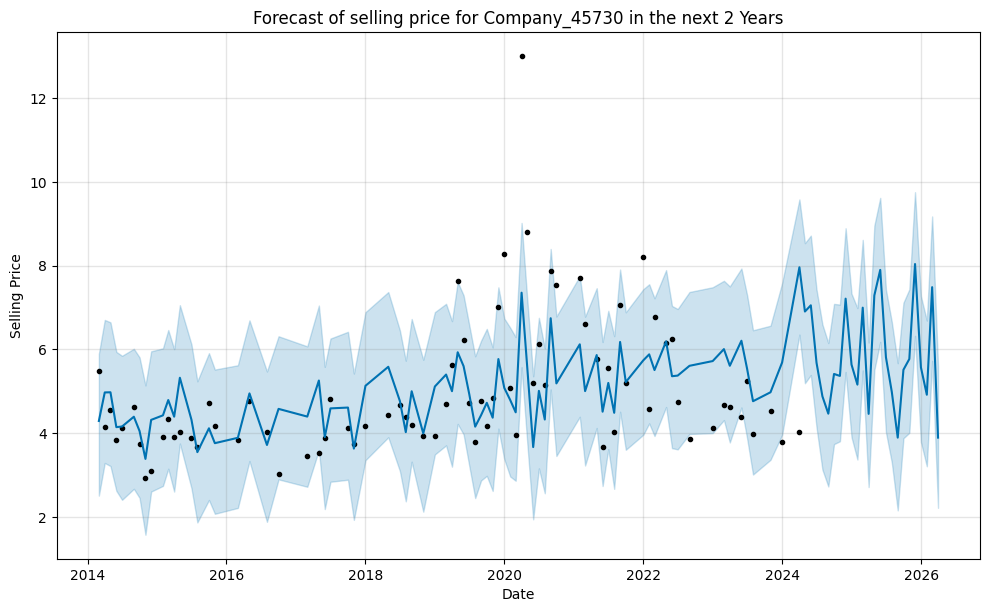

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/akj7a4p1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/dtptfuf7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22890', 'data', 'file=/tmp/tmpco321nsp/akj7a4p1.json', 'init=/tmp/tmpco321nsp/dtptfuf7.json', 'output', 'file=/tmp/tmpco321nsp/prophet_model7u3qiag6/prophet_model-20240519181454.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:14:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:14:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

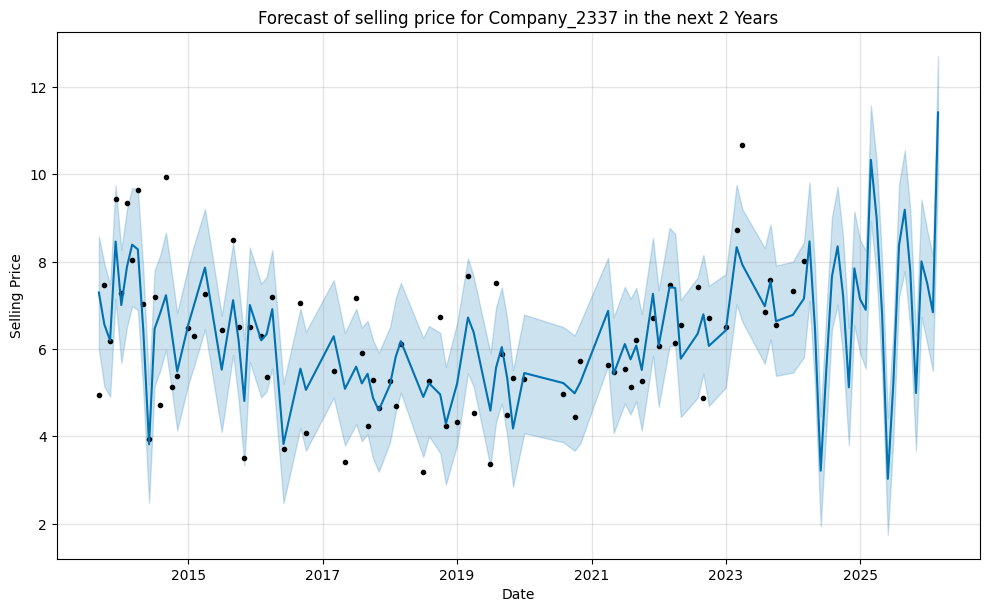

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/a1jup129.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/spgsx1kf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45201', 'data', 'file=/tmp/tmpco321nsp/a1jup129.json', 'init=/tmp/tmpco321nsp/spgsx1kf.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modelgty9rlmj/prophet_model-20240519181455.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:14:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:14:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

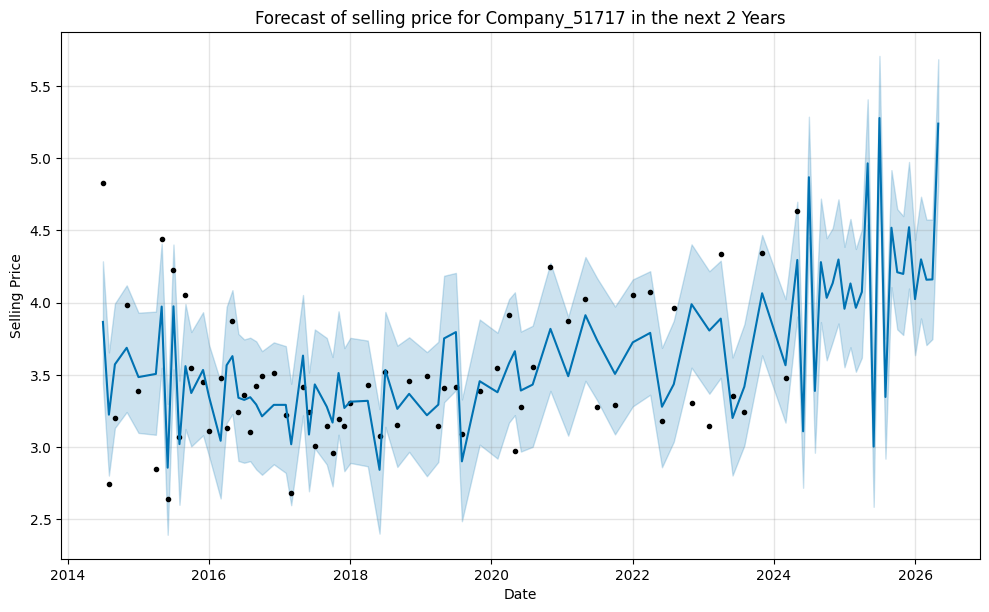

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/wl5tfxkb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/ndtksl1s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61025', 'data', 'file=/tmp/tmpco321nsp/wl5tfxkb.json', 'init=/tmp/tmpco321nsp/ndtksl1s.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modeldf6v5aqa/prophet_model-20240519181455.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:14:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:14:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

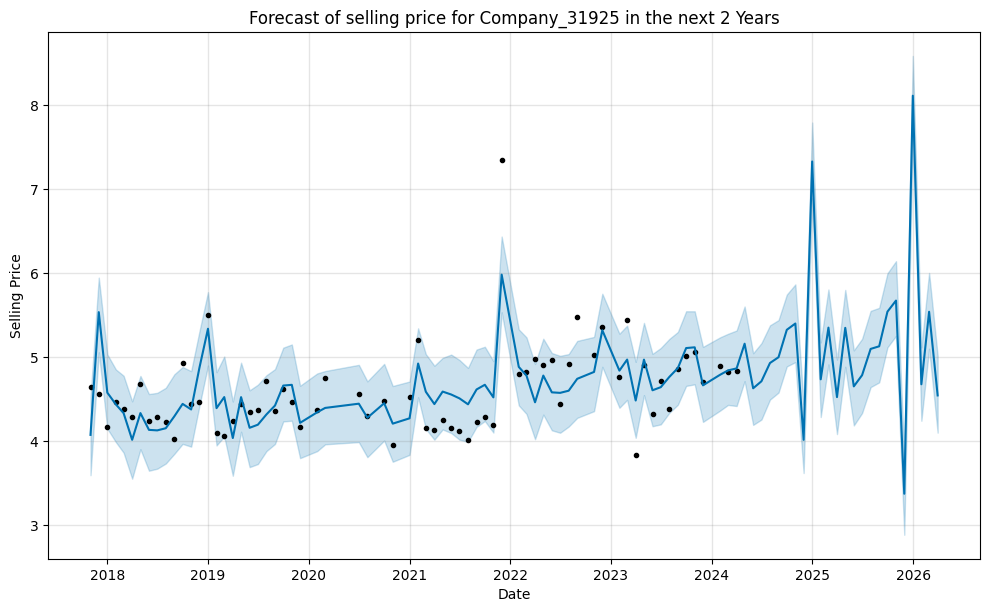

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/ii_ycy2x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/wyd70b1f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31120', 'data', 'file=/tmp/tmpco321nsp/ii_ycy2x.json', 'init=/tmp/tmpco321nsp/wyd70b1f.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modelvqflwr8v/prophet_model-20240519181456.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:14:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:14:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

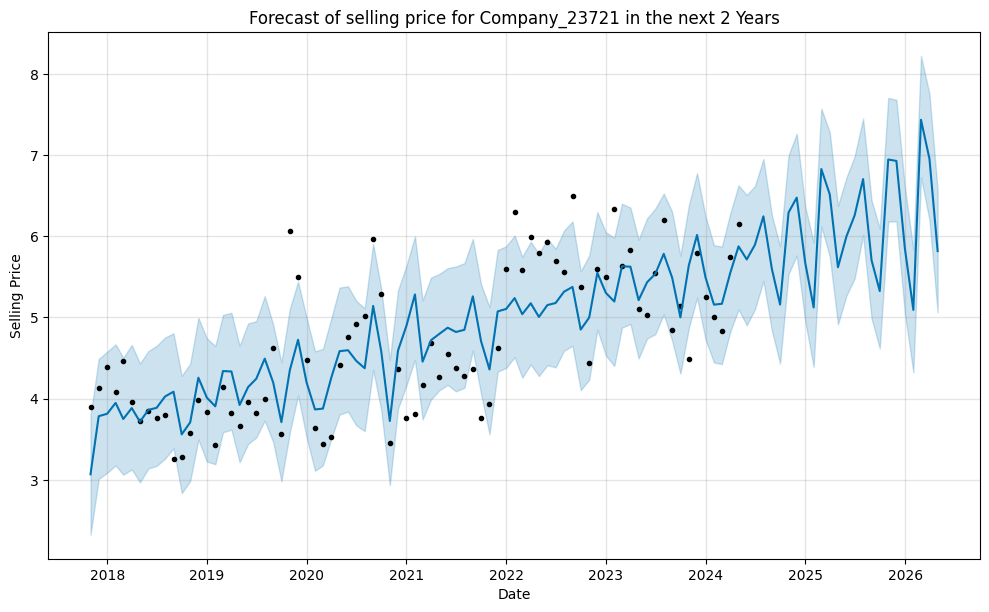

In [22]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['selling_price']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  future_dates = model.make_future_dataframe(periods=24, freq='M')
  curr_forecast = model.predict(future_dates)

  plt.figure(figsize=(10, 6))

  model.plot(curr_forecast)
  plt.title(f'Forecast of selling price for {id} in the next 2 Years')
  plt.xlabel('Date')
  plt.ylabel('Selling Price')
  plt.show()

In [ ]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['selling_price']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')
  error = performance_metrics(df_cv)["mape"].mean()
  mape[id] = error

In [21]:
mape

{'Company_43754': 0.16668774136820386,
 'Company_45730': 0.3058044359542258,
 'Company_2337': 0.22840470730638227,
 'Company_51717': 0.13250592663179567,
 'Company_31925': 0.08971112300793105,
 'Company_23721': 0.15523048854538327}

###Product Quantity

In [24]:
with open('company_quantity_fine_tune_result.pkl', 'rb') as file:
  mape = pickle.load(file)
best_params = {}
for id in filtered_id:
  tuning_results = pd.DataFrame(grid)
  tuning_results['mape'] = mape[id]
  best_params[id] = tuning_results[tuning_results.mape == tuning_results.mape.min()].transpose()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/_w9awlm_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/3zi8t7y_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36310', 'data', 'file=/tmp/tmpco321nsp/_w9awlm_.json', 'init=/tmp/tmpco321nsp/3zi8t7y_.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modelvhxvj75q/prophet_model-20240519181654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:16:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:16:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

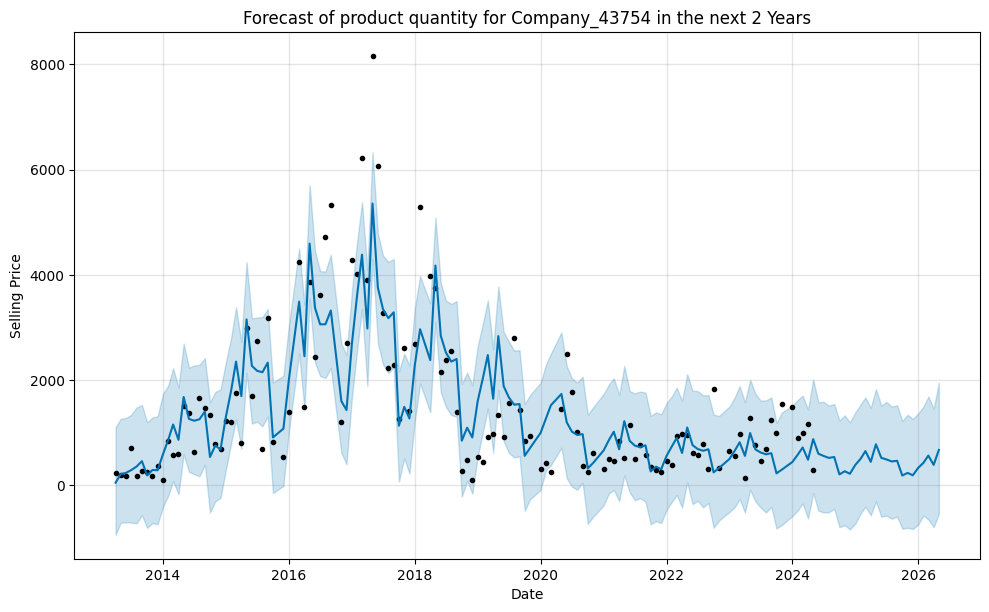

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/v6xv71z0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/9iivtaoh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56255', 'data', 'file=/tmp/tmpco321nsp/v6xv71z0.json', 'init=/tmp/tmpco321nsp/9iivtaoh.json', 'output', 'file=/tmp/tmpco321nsp/prophet_model5jka9k3i/prophet_model-20240519181655.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:16:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:16:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

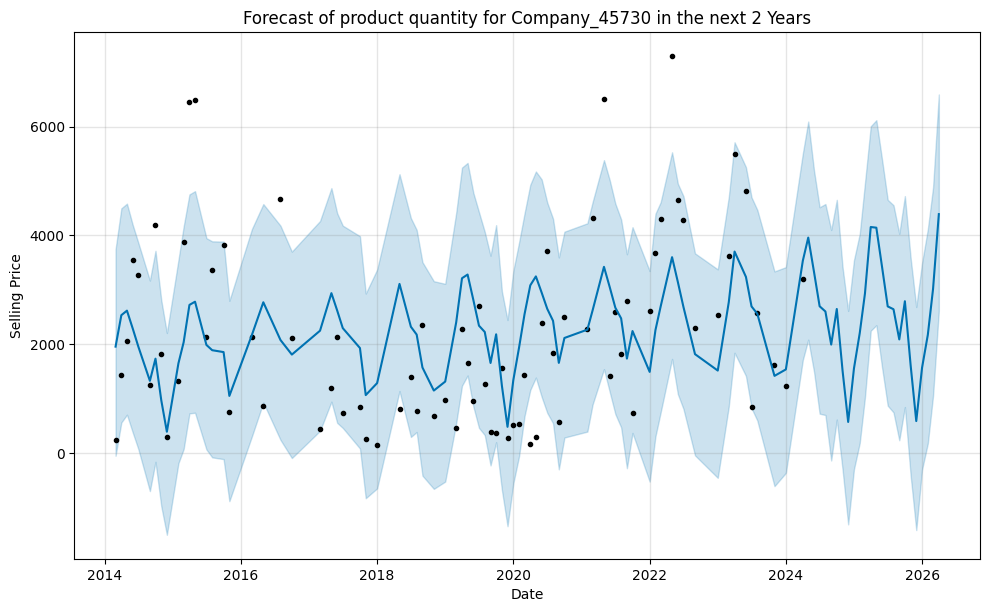

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/pq0s34n0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/rssm0_wn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59422', 'data', 'file=/tmp/tmpco321nsp/pq0s34n0.json', 'init=/tmp/tmpco321nsp/rssm0_wn.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modeliku3p7rl/prophet_model-20240519181655.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:16:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:16:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

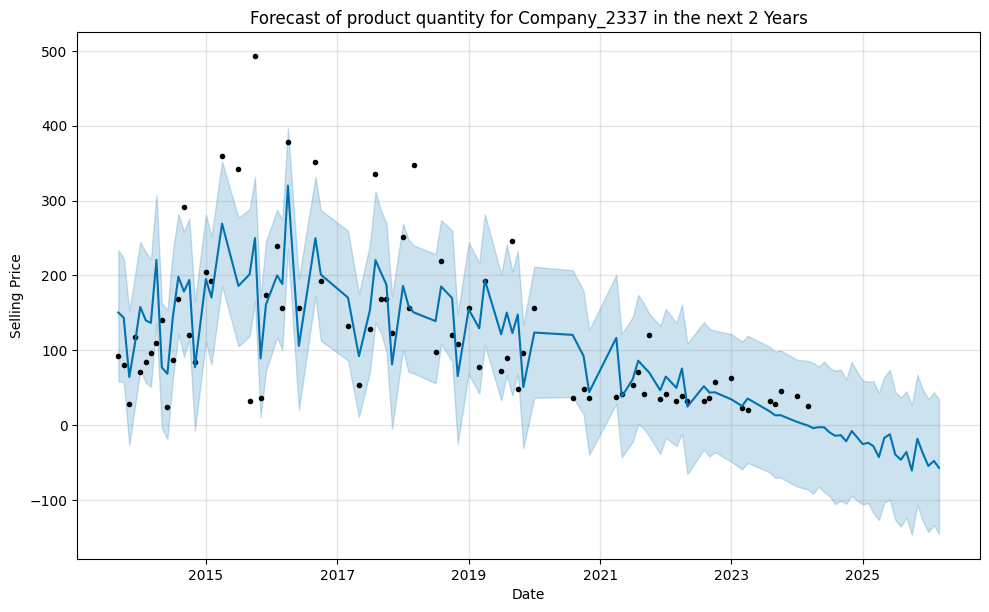

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/xsprxbc9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/g2_xpd7r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60869', 'data', 'file=/tmp/tmpco321nsp/xsprxbc9.json', 'init=/tmp/tmpco321nsp/g2_xpd7r.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modeldjmujoo8/prophet_model-20240519181656.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:16:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:16:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

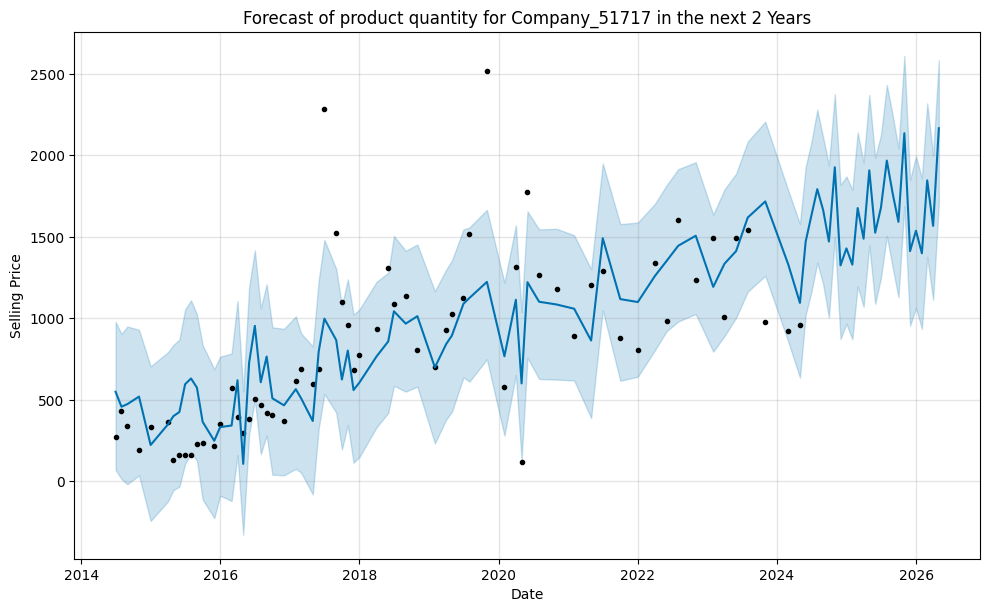

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/w3h5n5ad.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/y1ur25ws.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98087', 'data', 'file=/tmp/tmpco321nsp/w3h5n5ad.json', 'init=/tmp/tmpco321nsp/y1ur25ws.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modelszznvcam/prophet_model-20240519181656.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:16:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:16:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

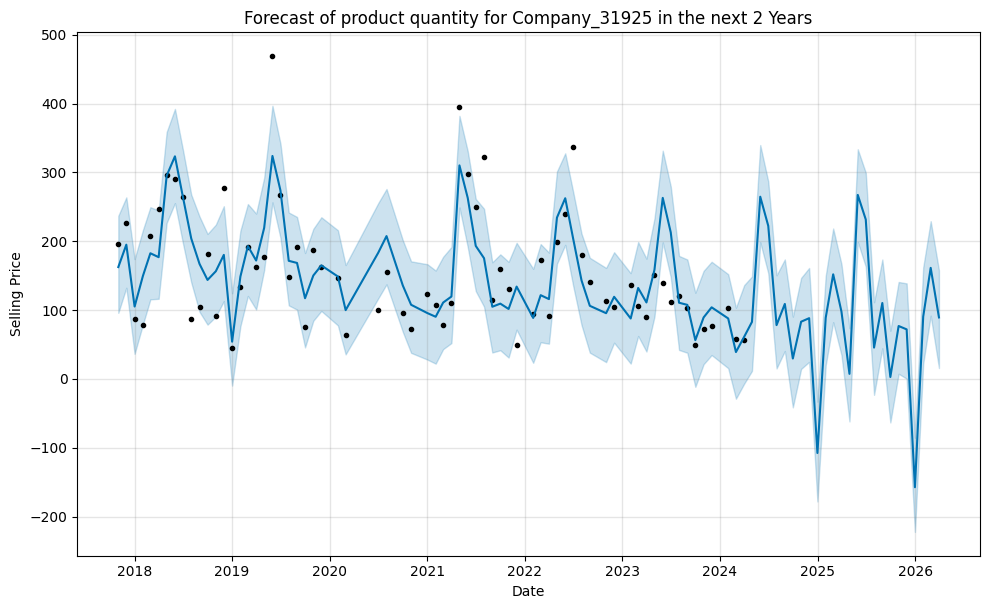

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/jpdupx25.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/ttds4ntq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64070', 'data', 'file=/tmp/tmpco321nsp/jpdupx25.json', 'init=/tmp/tmpco321nsp/ttds4ntq.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modela8p_1v78/prophet_model-20240519181656.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:16:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:16:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

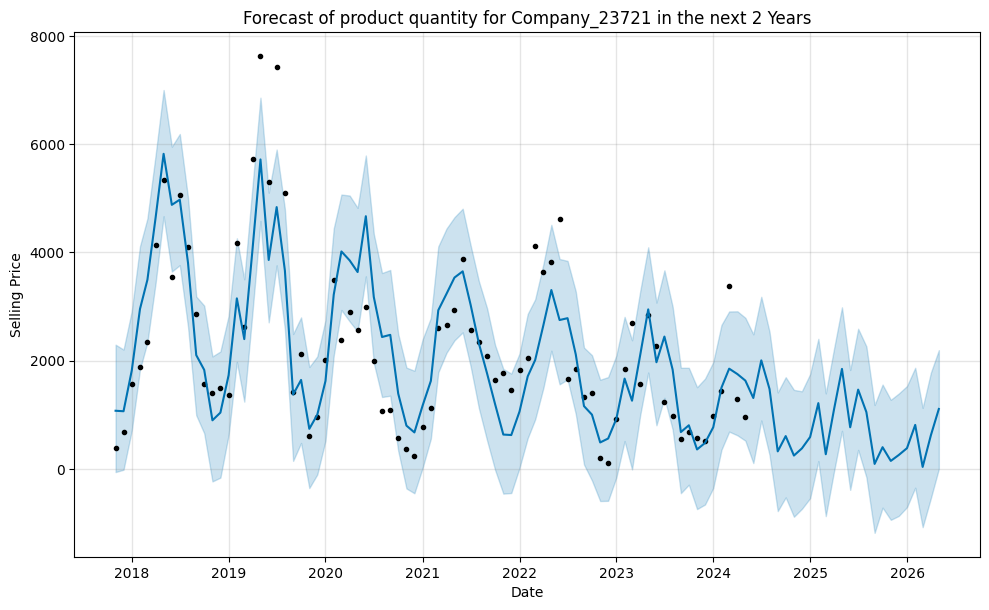

In [26]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  future_dates = model.make_future_dataframe(periods=24, freq='M')
  curr_forecast = model.predict(future_dates)

  plt.figure(figsize=(10, 6))

  model.plot(curr_forecast)
  plt.title(f'Forecast of product quantity for {id} in the next 2 Years')
  plt.xlabel('Date')
  plt.ylabel('Selling Price')
  plt.show()

In [ ]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')
  error = performance_metrics(df_cv)["mape"].mean()
  mape[id] = error

In [28]:
mape

{'Company_43754': 1.77821567169211,
 'Company_45730': 1.3105526245674783,
 'Company_2337': 1.171798692304127,
 'Company_51717': 0.7307816979751585,
 'Company_31925': 0.5194212432235392,
 'Company_23721': 0.5368917749141948}

##Country Shipping

In [31]:
column_name = 'Shipping Country'

In [32]:
unique_id = df[column_name].unique()
filtered_id = []
for id in unique_id:
  curr_df = df[df[column_name] == id]
  months_reported = curr_df['year_month'].unique()
  if len(months_reported) > 60:
    for i in months_reported:
      if pd.Period('2023-06') <= i <= pd.Period('2024-05'):
        filtered_id.append(id)
        break
len(filtered_id)

2

###Selling Price

In [34]:
with open('country_fine_tune_result.pkl', 'rb') as file:
  mape = pickle.load(file)
best_params = {}
for id in filtered_id:
  tuning_results = pd.DataFrame(grid)
  tuning_results['mape'] = mape[id]
  best_params[id] = tuning_results[tuning_results.mape == tuning_results.mape.min()].transpose()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/tkw9_gwl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/r2_4hrpz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99692', 'data', 'file=/tmp/tmpco321nsp/tkw9_gwl.json', 'init=/tmp/tmpco321nsp/r2_4hrpz.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modele8oav4z0/prophet_model-20240519181940.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:19:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:19:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

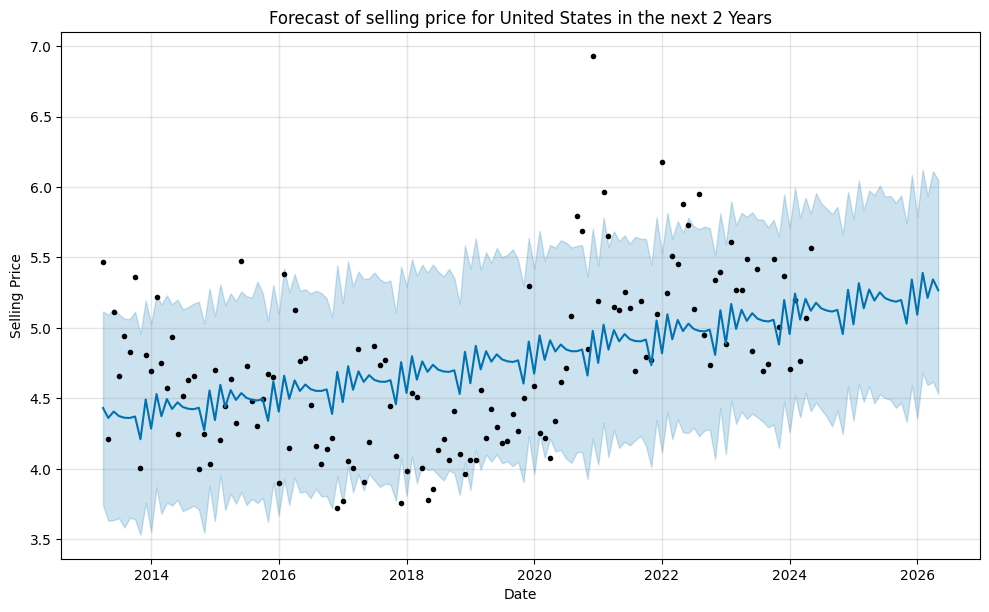

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/n0wjx44u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/_ivjsm33.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44266', 'data', 'file=/tmp/tmpco321nsp/n0wjx44u.json', 'init=/tmp/tmpco321nsp/_ivjsm33.json', 'output', 'file=/tmp/tmpco321nsp/prophet_modeln21sm4o6/prophet_model-20240519181940.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:19:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:19:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

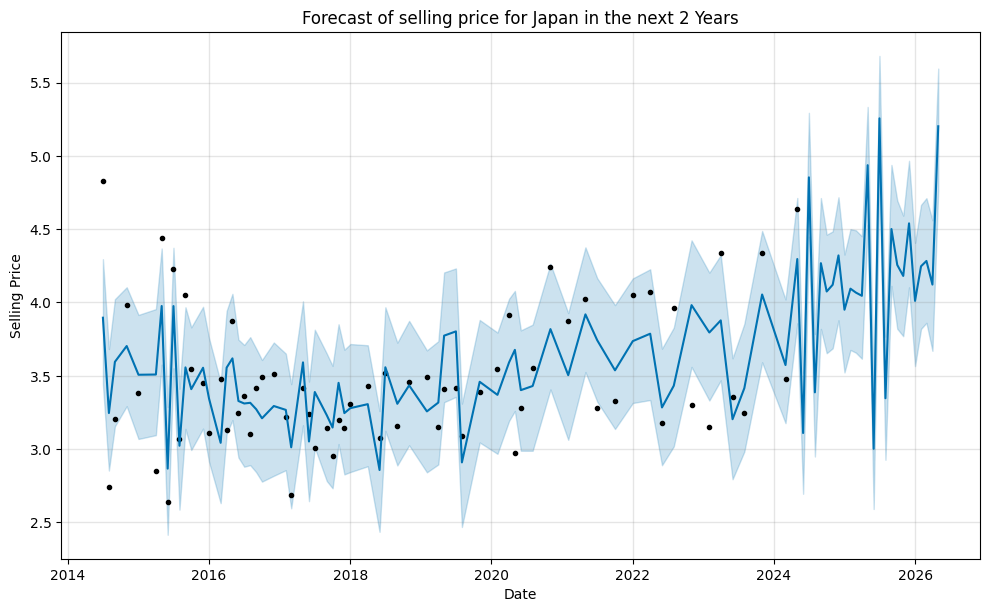

In [35]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['selling_price']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  future_dates = model.make_future_dataframe(periods=24, freq='M')
  curr_forecast = model.predict(future_dates)

  plt.figure(figsize=(10, 6))

  model.plot(curr_forecast)
  plt.title(f'Forecast of selling price for {id} in the next 2 Years')
  plt.xlabel('Date')
  plt.ylabel('Selling Price')
  plt.show()

In [ ]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['selling_price']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')
  error = performance_metrics(df_cv)["mape"].mean()
  mape[id] = error

In [37]:
mape

{'United States': 0.10505720661310727, 'Japan': 0.1320156964804791}

###Product Quantity

In [38]:
with open('country_quantity_fine_tune_result.pkl', 'rb') as file:
  mape = pickle.load(file)
best_params = {}
for id in filtered_id:
  tuning_results = pd.DataFrame(grid)
  tuning_results['mape'] = mape[id]
  best_params[id] = tuning_results[tuning_results.mape == tuning_results.mape.min()].transpose()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/hf9mi1ug.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/kgzojx5p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70530', 'data', 'file=/tmp/tmpco321nsp/hf9mi1ug.json', 'init=/tmp/tmpco321nsp/kgzojx5p.json', 'output', 'file=/tmp/tmpco321nsp/prophet_model2y4mkls_/prophet_model-20240519182012.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

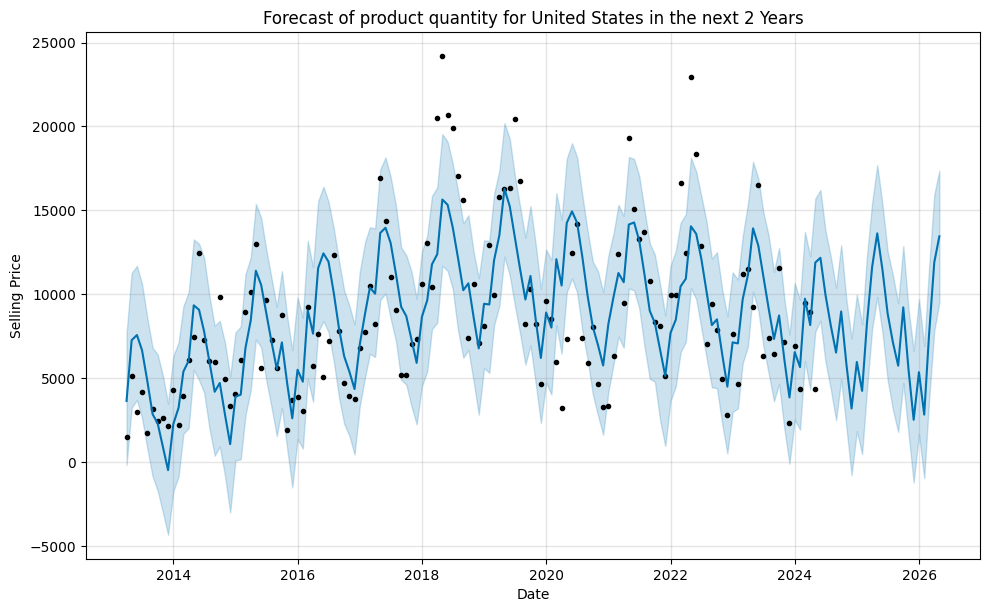

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/3xben7nf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpco321nsp/4g6pyzq4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72610', 'data', 'file=/tmp/tmpco321nsp/3xben7nf.json', 'init=/tmp/tmpco321nsp/4g6pyzq4.json', 'output', 'file=/tmp/tmpco321nsp/prophet_model0hmr6n8y/prophet_model-20240519182012.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:20:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

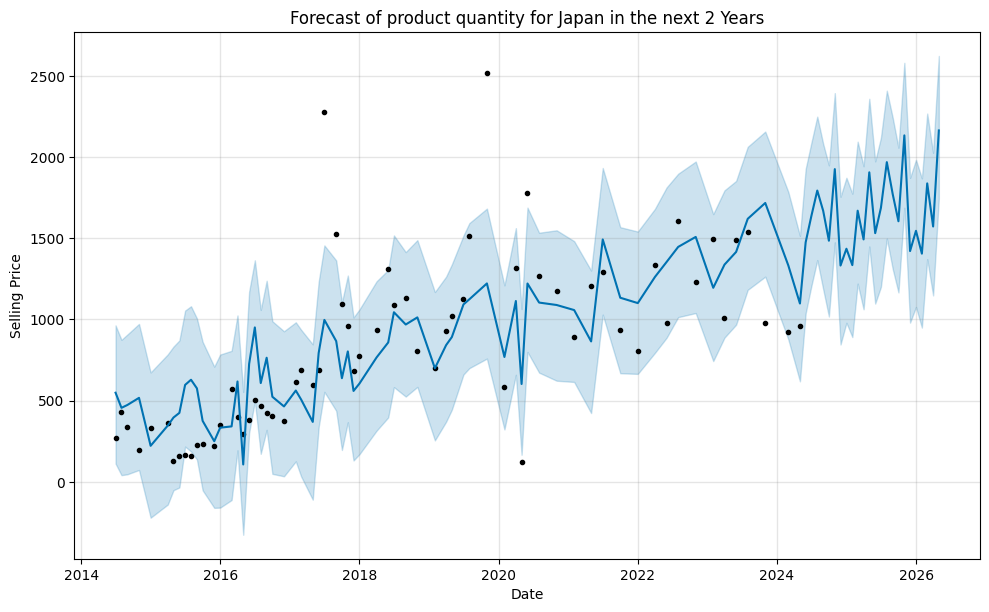

In [39]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  future_dates = model.make_future_dataframe(periods=24, freq='M')
  curr_forecast = model.predict(future_dates)

  plt.figure(figsize=(10, 6))

  model.plot(curr_forecast)
  plt.title(f'Forecast of product quantity for {id} in the next 2 Years')
  plt.xlabel('Date')
  plt.ylabel('Selling Price')
  plt.show()

In [ ]:
mape = {}
for id in filtered_id:
  curr_df = df[df[column_name] == id]

  curr_df = curr_df.groupby(['year_month']).agg({
      'Product Quantity': 'sum',
      'Total Selling Price': 'sum'
  }).reset_index()
  curr_df['selling_price'] = curr_df['Total Selling Price']/curr_df['Product Quantity']

  curr_df['ds'] = pd.PeriodIndex(curr_df['year_month'], freq='M').to_timestamp()
  curr_df['y'] = curr_df['Product Quantity']
  prophet_data = curr_df[['ds', 'y']]

  model = Prophet(seasonality_mode = best_params[id].iloc[2, 0],
                seasonality_prior_scale = best_params[id].iloc[3, 0],
                holidays_prior_scale = best_params[id].iloc[1, 0],
                changepoint_prior_scale = best_params[id].iloc[0, 0])
  model.fit(prophet_data)

  df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon='365 days')
  error = performance_metrics(df_cv)["mape"].mean()
  mape[id] = error

In [41]:
mape

{'United States': 0.47256085777601636, 'Japan': 0.7283472919992983}